In [1]:
import pandas as pd
import numpy as np
import tslearn as ts
import cryptocompare
import umap
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
sns.color_palette('husl', 10, as_cmap=True)

from collections import Counter
from tqdm import tqdm
import tsfel
from tsfresh import extract_features, extract_relevant_features
from tsfresh.feature_extraction.settings import ComprehensiveFCParameters, MinimalFCParameters
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans, HDBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score
from tslearn.clustering import TimeSeriesKMeans

### General params

In [2]:
SEED = 42
COINS_LIMIT = 100
np.random.seed(SEED)

Ограничимся 100 криптовалютами для каждой группы (из-за ограничений API и отсутствием курса в USD для многих валют)

### Load

In [3]:
all_coins = cryptocompare.get_coin_list(format=True)

Напишем универсальную функцию для получения истории курса криптовалют к USD

In [32]:
# get history
def get_price_history(
                        func, 
                        coins_list,
                        periods,
                        coins_limit
                        ):
    curr_price_hist = {}
    for coin in tqdm(['BTC'] + list(np.random.permutation(coins_list))):
        val = func(coin, currency='USD', limit=periods)
        if val is not None:
            hist = {"time": [], "price": []}
            _ = [(hist["time"].append(v.get("time")), hist["price"].append(v.get("close"))) for v in val]
            curr_price_hist[coin] = hist
        curr_coins = len(curr_price_hist)
        if curr_coins == coins_limit:
            break
        print(f"coins collected: {curr_coins}")
    return curr_price_hist    

#### 30 days history with 1 day interval

In [ ]:
hist_pr = get_price_history(
                                    func=cryptocompare.get_historical_price_day,
                                    coins_list=all_coins,
                                    periods=30,
                                    coins_limit=COINS_LIMIT
                                    )

In [9]:
len(hist_pr)

100

In [17]:
Counter([len(x.get('time')) for x in hist_pr.values()])

Counter({31: 100})

In [22]:
df_hist = pd.DataFrame(hist_pr).T.explode(column=['time', 'price']).reset_index(drop=False, names='currency')
df_hist.to_csv('./data/price_hist_30d.csv', index=False)

Получим истории курсов для каждой группы

#### 3 days history with 1 hour interval

In [ ]:
hist_pr = get_price_history(
                                    func=cryptocompare.get_historical_price_hour,
                                    coins_list=all_coins,
                                    periods=3*24,
                                    coins_limit=COINS_LIMIT
                                    )

In [34]:
len(hist_pr)

100

In [35]:
Counter([len(x.get('time')) for x in hist_pr.values()])

Counter({73: 100})

In [36]:
df_hist = pd.DataFrame(hist_pr).T.explode(column=['time', 'price']).reset_index(drop=False, names='currency')
df_hist.to_csv('./data/price_hist.csv', index=False)

#### 1 hour history with 1 minute interval

In [ ]:
hist_pr = get_price_history(
                                    func=cryptocompare.get_historical_price_minute,
                                    coins_list=all_coins,
                                    periods=60,
                                    coins_limit=COINS_LIMIT
                                    )

In [41]:
len(hist_pr)

100

In [42]:
Counter([len(x.get('time')) for x in hist_pr.values()])

Counter({61: 100})

In [43]:
df_hist = pd.DataFrame(hist_pr).T.explode(column=['time', 'price']).reset_index(drop=False, names='currency')
df_hist.to_csv('./data/price_hist_1h.csv', index=False)

### Analysis

**Основные принципы анализа**:
1. Будем масштабировать временные ряды курсов крпитовалют (с помощью Standard Scaler), т.к. как правило диапазон цен в USD сильно отличается
1. Будем использовать алгоритмы кластеризации KMeans и HDBSCAN
1. В качестве основных метрик для подбора оптимального количества кластеров будем использовать Silhouette Score, Davies-Bouldin score и инерцию (метод локтя, для KMeans) 
1. Рассмотрим следующие комбинации исходных данных/признаков  
    1. Исходные масштабированные временные ряды
    1. Исходные масштабированные временные ряды + понижение размерности (UMAP)
    1. Извлеченные признаки на основе библиотек tsfresh и tsfel
1. Также для исходных масштабированных данных воспользуемся алгоритмом KMeans с метрикой на основе метода динамической трансформации шкалы
1. Помимо метрик качества также будем визуально оценивать, насколько качественно алгоритм справился с поставленной задачей
    1. Графики для изменения цены со временем для нескольких криптовалют в каждом кластере в сравнение с BTC
    1. Понижение размерности (UMAP) + визуализация 
1. Из предыдущего пункта следует, что будем больше отдавать предпочтение тем методам, которые будут давать осмысленные и пригодные для анализа цен результаты (кластера будут включать визуально похожие по динамике валюты), а не тем, у которых исключительно лучше метрики

#### Functions

In [64]:
# scale timeseries
def scale_ts(data, func_scaler):
    data = data.assign(price_n=np.nan)
    for currency in data.currency.unique():
        prices_curr = data.query(f'currency == "{currency}"').price
        data['price_n'][prices_curr.index] = func_scaler().fit_transform(prices_curr.to_numpy().reshape((-1, 1))).flatten()
    return data

# convert data to tsfel format
def to_tsfel_format(data: pd.DataFrame):
    prices = []
    for currency in data.currency.unique():
        prices_curr = data.query(f'currency == "{currency}"').price
        prices.append(data['price'][prices_curr.index].to_numpy())
    return prices, list(data.currency.unique())

# preprocess extracted features (tsfel/tsfresh)
def preprocess_extracted(
        data,
        nan_thresh=0.9,
        fill_na_val=0,
        scaler=None,

):
        
    print(f"Initial shape: {data.shape}")
    
    # drop cols witn nans 
    data = data.dropna(axis=1, thresh=nan_thresh)
    print(f"After drop nans: {data.shape}")

    # fillna
    data = data.fillna(fill_na_val)

    # drop cols with singular values
    un_vals = data.apply(lambda x: x.nunique(), axis=0)
    sing_val_cols = list(un_vals[un_vals == 1].keys())
    cols_to_keep = list(set(data.columns) - set(sing_val_cols))
    data = data[cols_to_keep]
    print(f"After drop singular value cols: {data.shape}")

    # drop cols with infs
    max_vals = data.max().sort_values()
    cols_with_infs = max_vals[max_vals == np.inf].index
    data = data.drop(columns=cols_with_infs)
    
    min_vals = data.min().sort_values()
    cols_with_infs = min_vals[min_vals == -np.inf].index
    data = data.drop(columns=cols_with_infs)
    print(f"After drop cols with infs: {data.shape}")

    idx = data.index

    if scaler:
        data = scaler().fit_transform(data)

    return data, idx


# adjust number of clusters for KMeans
def kmeans_adjust(
        data,
        max_iter=100,
        max_clusters=20,
        verbose=True,
        dtw=None,
        seed=42,
):
    sil_sc = []
    db_sc = []
    inetrtia = []
    for k in range(2, max_clusters):
        if dtw:
            kmeans = TimeSeriesKMeans(
                                            n_clusters=k, 
                                            metric=dtw,
                                            max_iter=max_iter, 
                                            random_state=seed
                                            )            
        else:            
            kmeans = KMeans(
                n_clusters=k,
                max_iter=max_iter,
                random_state=seed
            )
        pred_cl = kmeans.fit_predict(data)
        inert = kmeans.inertia_
        inetrtia.append(inert)
        s = silhouette_score(data, pred_cl)
        sil_sc.append(s)
        db = davies_bouldin_score(data, pred_cl)
        db_sc.append(db)
        if verbose:
            print(f"Clusters: {k}")
            print(f"Inertia: {inert}")
            print(f"Silhouette score: {s}")
            print(f"Davies-Bouldin score: {db}")    

    fig, ax = plt.subplots(3, figsize=(6,12))
    ax[0].plot(np.arange(2, max_clusters), inetrtia)
    ax[1].plot(np.arange(2, max_clusters), sil_sc)
    ax[2].plot(np.arange(2, max_clusters), db_sc)
    ax[0].set_title('inertia')
    ax[1].set_title('silhouette score')
    ax[2].set_title('davies-bouldin score')
    ax[0].grid(True)
    ax[1].grid(True)
    ax[2].grid(True)
    plt.show()


# evaluate clustering    
def evaluate_clustering(
        preds,
        data,
        data_orig,
        idx,
        show_cluster=None,
        show_limit=10,
        norm_by_first_val=False,
        random_state=42
):
    s = silhouette_score(data, preds)
    db = davies_bouldin_score(data, preds)
    print(f"Silhouette score: {s}")
    print(f"Davies-Bouldin score: {db}")

    results = pd.DataFrame(data, index=idx)
    results['cluster'] = preds

    print(f"Clusters:\n{results.cluster.value_counts()}")
    btc_cluster = results.loc['BTC', 'cluster']
    print(f"BTC cluster: {btc_cluster}")

    unique_clusters = sorted(np.unique(preds))
    if show_cluster is None:
        fig, ax = plt.subplots(len(unique_clusters), figsize=(10,20), sharex=True)
        for i, show_cluster in enumerate(unique_clusters):
            curr_list_show = list(results.query(f'cluster == {show_cluster}').index)
            for currency in curr_list_show[:show_limit]:
                vals = data_orig.query(f'currency == "{currency}"').reset_index(drop=True)
                if norm_by_first_val:
                    ax[i].plot(vals.time_n, vals.price / (vals.query('time_n == 1').price.values[0] + 1e-22), '-')
                else:
                    ax[i].plot(vals.time_n, vals.price_n, '-')
            vals_btc = data_orig.query(f'currency == "BTC"').reset_index(drop=True)    
            if norm_by_first_val:
                ax[i].plot(vals_btc.time_n, vals_btc.price / (vals_btc.query('time_n == 1').price.values[0] + 1e-22), 'o-', label='BTC', c='k')
            else:
                ax[i].plot(vals_btc.time_n, vals_btc.price_n, 'o-', label='BTC', c='k')
            ax[i].legend()
            ax[i].grid(True)
            ax[i].set_title(f"Cluster {show_cluster}" if show_cluster != btc_cluster else f"BTC Cluster {show_cluster}")
        plt.show();            
    else:
        fig, ax = plt.subplots(1, figsize=(10,6))
        curr_list_show = list(results.query(f'cluster == {show_cluster}').index)
        for currency in curr_list_show[:show_limit]:
            vals = data_orig.query(f'currency == "{currency}"').reset_index(drop=True)
            if norm_by_first_val:
                ax.plot(vals.time_n, vals.price / (vals.query('time_n == 1').price.values[0] + 1e-22), '-')
            else:
                ax.plot(vals.time_n, vals.price_n, '-')
        vals_btc = data_orig.query(f'currency == "BTC"').reset_index(drop=True)    
        if norm_by_first_val:
            ax.plot(vals_btc.time_n, vals_btc.price / (vals_btc.query('time_n == 1').price.values[0] + 1e-22), 'o-', label='BTC', c='k')
        else:
            ax.plot(vals_btc.time_n, vals_btc.price_n, 'o-', label='BTC', c='k')
        ax.legend()
        ax.grid(True)
        plt.show();    

    umap_model = umap.UMAP(n_components=2, random_state=random_state)
    data = umap_model.fit_transform(data)
    data = pd.DataFrame(data, index=idx)
    data.index.name = 'currency'
    data['cluster'] = preds
    
    fig_sc, ax_sc = plt.subplots()
    sns.scatterplot(data, x=0, y=1, hue='cluster', palette='bright', ax=ax_sc)
    ax_sc.plot(data.loc['BTC'][0], data.loc['BTC'][1], markersize=14, c='r', marker='*')
    ax_sc.text(data.loc['BTC'][0], data.loc['BTC'][1], 'BTC')
    plt.show();

    return data.reset_index().groupby('cluster').currency.agg(lambda x: list(x)).to_dict()

#### 30 days history with 1 day interval

##### Load

In [115]:
df_hist = pd.read_csv('./data/price_hist_30d.csv')

In [116]:
df_hist = df_hist.sort_values(['currency', 'time'], ascending=True)
df_hist = df_hist.assign(time_n=df_hist.groupby(['currency']).cumcount().add(1))

Выведем несколько временнных рядов, отнормированных на начальное значение, в сравнение с биткоином

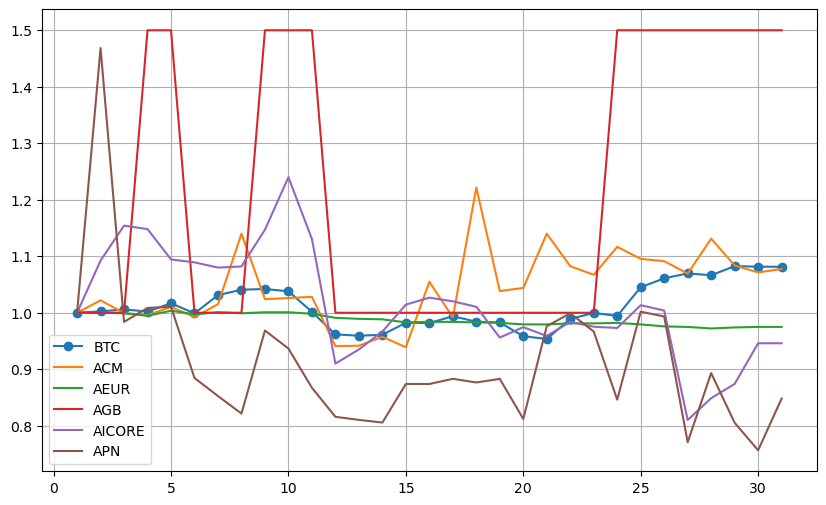

In [117]:
show_lim = 5
curr_list_show = ['BTC']
curr_list_show.extend(list(df_hist.currency.unique()[:show_lim]))

fig, ax = plt.subplots(1, figsize=(10,6))
for currency in curr_list_show:
    ls = 'o-' if currency == 'BTC' else '-'
    vals = df_hist.query(f'currency == "{currency}"').reset_index(drop=True)
    ax.plot(vals.time_n, vals.price / (vals.query('time_n == 1').price.values[0] + 1e-20), ls, label=currency)
    ax.legend()
    ax.grid(True)
plt.show();

##### Scale time series

In [118]:
df_hist = scale_ts(df_hist, StandardScaler)

##### Raw format

Исходные данные приводятся к необходимому для кластеризации виду

In [120]:
df_hist_raw = df_hist.pivot(index='currency', columns='time_n', values='price')

In [121]:
ind_raw = df_hist_raw.index

##### raw+KMeans

Clusters: 2
Inertia: 220346584.19681033
Silhouette score: 0.9889724305148886
Davies-Bouldin score: 0.0009743376090100729
Clusters: 3
Inertia: 4584938.615638467
Silhouette score: 0.9753603665058028
Davies-Bouldin score: 0.0028382126680989994
Clusters: 4
Inertia: 405310.9271031854
Silhouette score: 0.9618638599970118
Davies-Bouldin score: 0.15997682666367014
Clusters: 5
Inertia: 25100.43760318531
Silhouette score: 0.9527438661396113
Davies-Bouldin score: 0.0033254020842934814
Clusters: 6
Inertia: 5010.338980640084
Silhouette score: 0.9063780248242952
Davies-Bouldin score: 0.13420217761253497
Clusters: 7
Inertia: 1351.5944053181138
Silhouette score: 0.8987131494733859
Davies-Bouldin score: 0.15805834300262064
Clusters: 8
Inertia: 530.406646818114
Silhouette score: 0.8907962182976078
Davies-Bouldin score: 0.09224050791777046
Clusters: 9
Inertia: 343.46539781811407
Silhouette score: 0.8740999303562549
Davies-Bouldin score: 0.10297679972587316
Clusters: 10
Inertia: 82.04091904455605
Silhouet

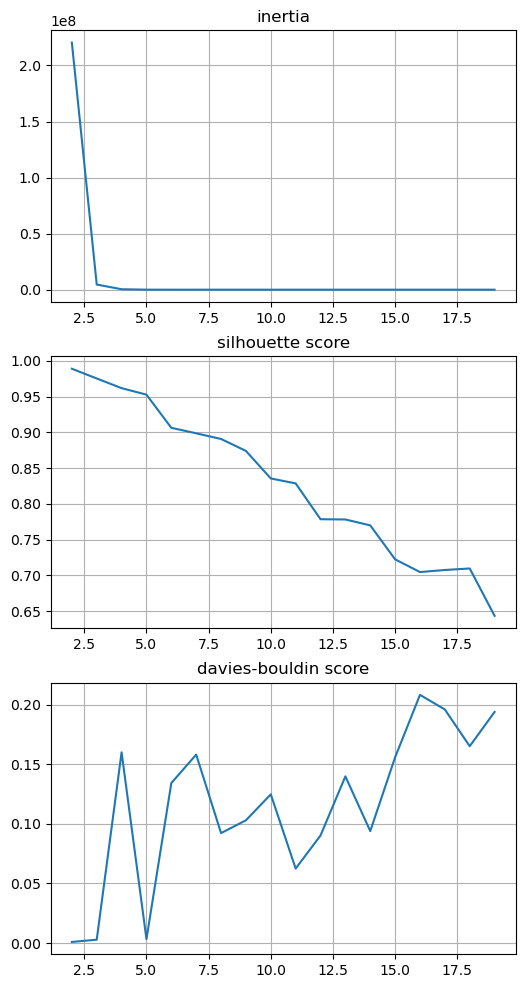

In [122]:
kmeans_adjust(
    df_hist_raw,
    max_iter=100,
    max_clusters=20,
    dtw=None,
    seed=SEED,
)

Выберем k=5

Silhouette score: 0.9527438661396113
Davies-Bouldin score: 0.0033254020842934814
Clusters:
cluster
0    96
3     1
1     1
4     1
2     1
Name: count, dtype: int64
BTC cluster: 1


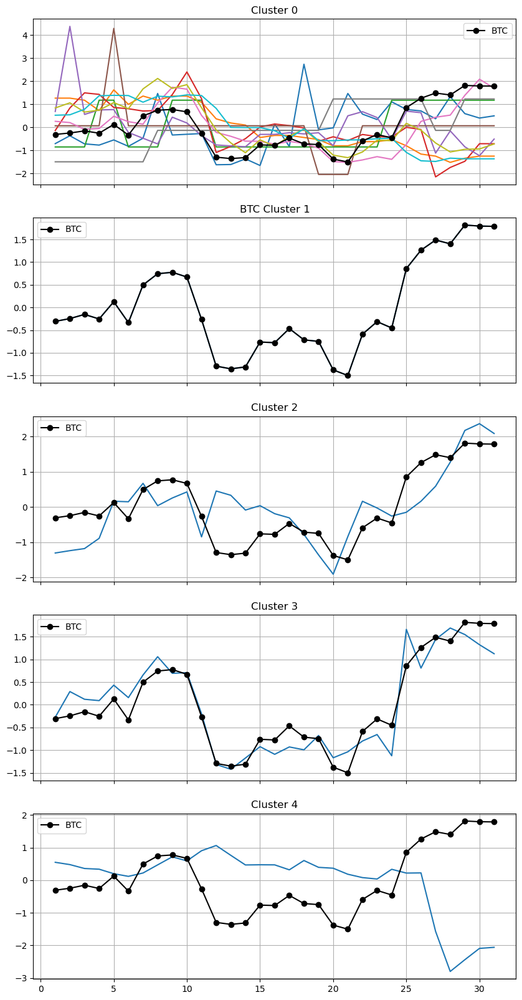

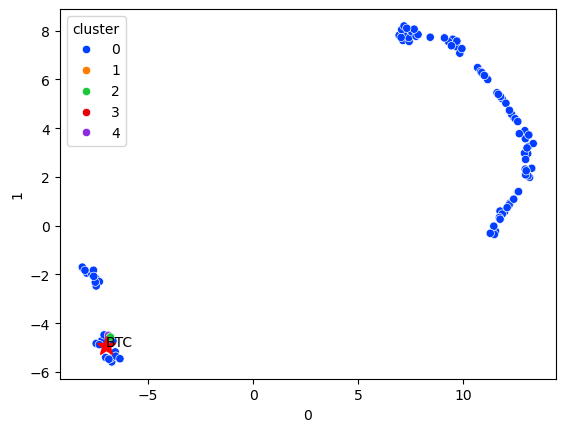

In [123]:
kmeans = KMeans(
    n_clusters=5,
    max_iter=100,
    random_state=SEED
)

pred_cl = kmeans.fit_predict(df_hist_raw)

curr_clusters = evaluate_clustering(
                                    pred_cl,
                                    df_hist_raw,
                                    df_hist,
                                    df_hist_raw.index,
                                    # show_cluster=0,
                                    show_limit=10,
                                    norm_by_first_val=False,
                                    random_state=SEED
                            )

Несмотря на неплохие метрики, KMeans на исходных данных не способен хорошо разделить временные ряды по группам, почти все криптовалюты складываются в один кластер, а BTC оказывается стоять особняком в отдельном кластере. Ситуация аналогична для других значений k

##### dimension reduction+raw+KMeans

Теперь снизим размерность исходных рядов до 5 компонент

In [124]:
umap_model = umap.UMAP(n_components=5, random_state=SEED)
df_hist_red = umap_model.fit_transform(df_hist_raw)
df_hist_red = pd.DataFrame(df_hist_red, index=df_hist_raw.index)

Clusters: 2
Inertia: 1063.87646484375
Silhouette score: 0.7184271216392517
Davies-Bouldin score: 0.3672085537238561
Clusters: 3
Inertia: 267.417724609375
Silhouette score: 0.730275571346283
Davies-Bouldin score: 0.3945210083073262
Clusters: 4
Inertia: 155.06541442871094
Silhouette score: 0.663420557975769
Davies-Bouldin score: 0.4771859390891209
Clusters: 5
Inertia: 101.33785247802734
Silhouette score: 0.6439952254295349
Davies-Bouldin score: 0.44973653966427973
Clusters: 6
Inertia: 75.35432434082031
Silhouette score: 0.6623896956443787
Davies-Bouldin score: 0.43867877054522025
Clusters: 7
Inertia: 47.84420394897461
Silhouette score: 0.6191354990005493
Davies-Bouldin score: 0.4605468782717416
Clusters: 8
Inertia: 27.175539016723633
Silhouette score: 0.6567443013191223
Davies-Bouldin score: 0.4042331160708435
Clusters: 9
Inertia: 20.570009231567383
Silhouette score: 0.6392499804496765
Davies-Bouldin score: 0.4251708642008692
Clusters: 10
Inertia: 16.131452560424805
Silhouette score: 0.6

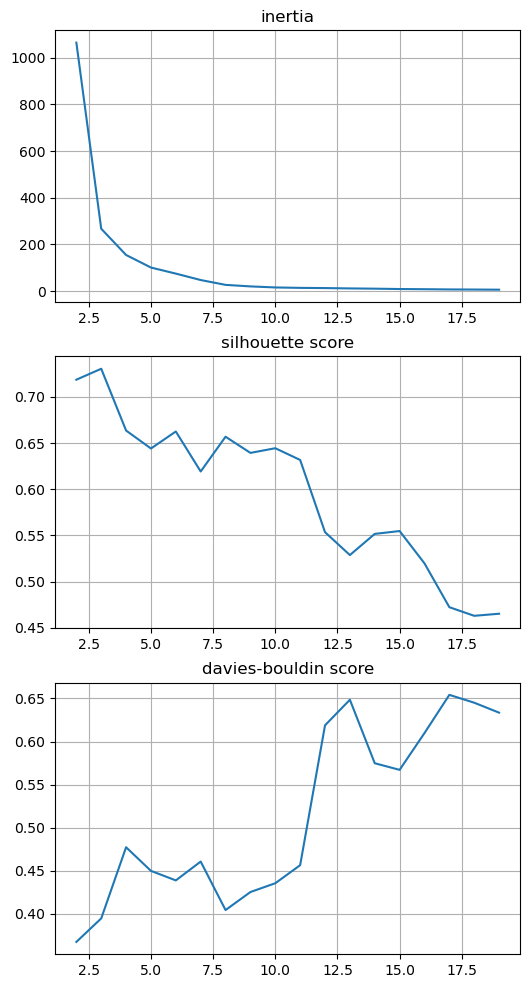

In [125]:
kmeans_adjust(
    df_hist_red,
    max_iter=100,
    max_clusters=20,
    dtw=None,
    seed=SEED,
)

Выберем k=3

Silhouette score: 0.730275571346283
Davies-Bouldin score: 0.3945210083073262
Clusters:
cluster
2    43
0    29
1    28
Name: count, dtype: int64
BTC cluster: 0


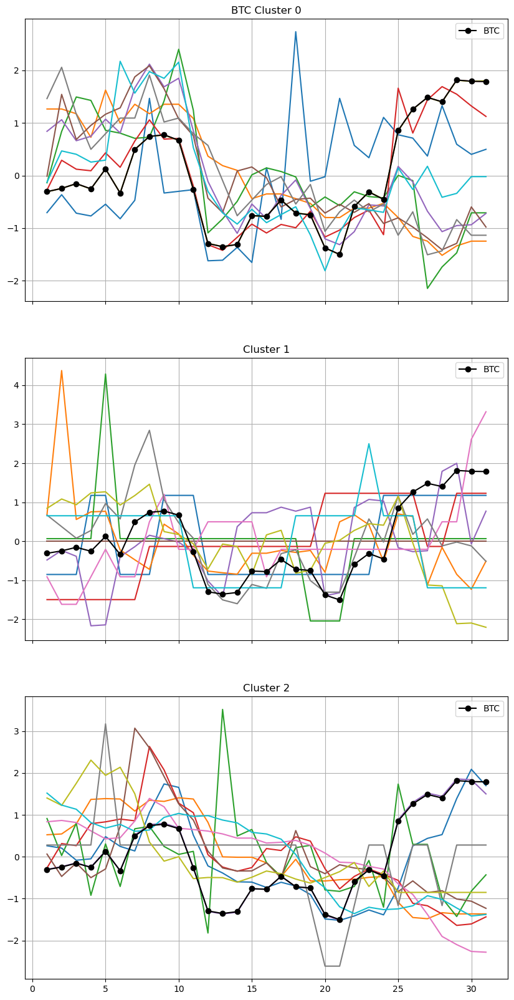

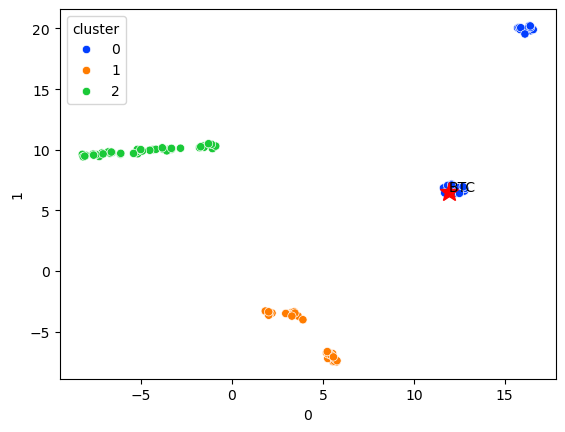

In [126]:
kmeans = KMeans(
    n_clusters=3,
    max_iter=1000,
    random_state=SEED
)

pred_cl = kmeans.fit_predict(df_hist_red)

curr_clusters = evaluate_clustering(
                                    pred_cl,
                                    df_hist_red,
                                    df_hist,
                                    df_hist_red.index,
                                    # show_cluster=1,
                                    show_limit=10,
                                    norm_by_first_val=False,
                                    random_state=SEED
                            )

Понижение размерности позволило разбить ряды на более сбалансированные по размеру кластера. И хоть кластера на scatter plot хорошо разделимы визуально, из графиков выше очевидно что кластера получаются слишком шумными (что отражается в более низких метриках)

##### raw+HDBSCAN

Silhouette score: -0.13448605693904622
Davies-Bouldin score: 1.9062480370823993
Clusters:
cluster
-1    52
 4    14
 2    13
 1    10
 0     6
 3     5
Name: count, dtype: int64
BTC cluster: -1


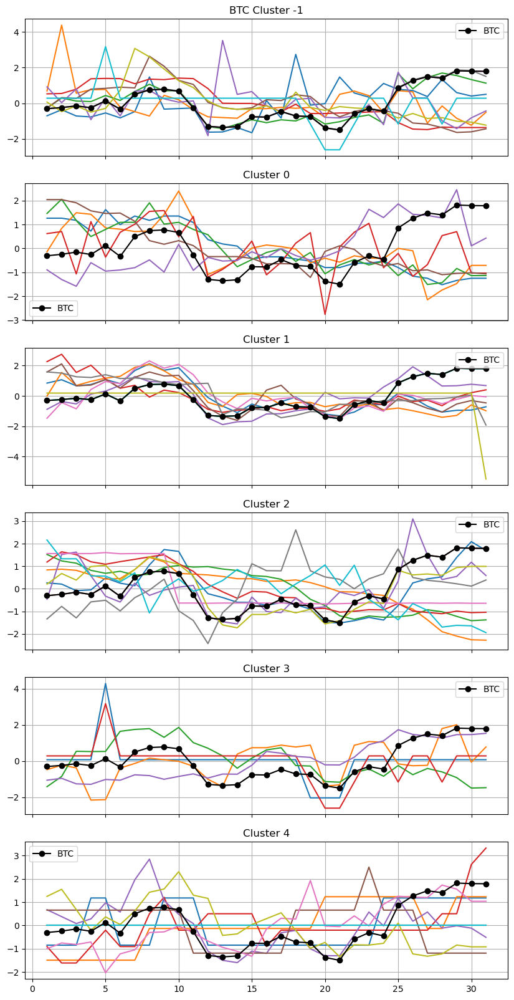

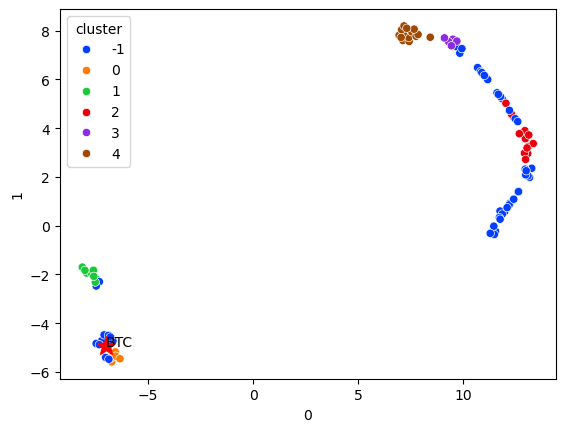

In [127]:
hdbscan = HDBSCAN()

pred_cl = hdbscan.fit_predict(df_hist_raw)
s = silhouette_score(df_hist_raw, pred_cl)
db = davies_bouldin_score(df_hist_raw, pred_cl)

curr_clusters = evaluate_clustering(
                                        pred_cl,
                                        df_hist_raw,
                                        df_hist,
                                        ind_raw,
                                        # show_cluster=1,
                                        show_limit=10,
                                        norm_by_first_val=False,
                                        random_state=SEED
                                )

Алгоритм иерархической кластеризации HDBSCAN на исходных данных дал слишком шумные кластера, соотвественно, низкие метрики

##### dimension reduction+raw+HDBSCAN

Теперь снизим размерность исходных рядов до 5 компонент

In [128]:
umap_model = umap.UMAP(n_components=5, random_state=SEED)
df_hist_red = umap_model.fit_transform(df_hist_raw)
df_hist_red = pd.DataFrame(df_hist_red, index=df_hist_raw.index)

Silhouette score: 0.5650182366371155
Davies-Bouldin score: 0.3544864976988546
Clusters:
cluster
 2    43
 0    17
 3    13
 1    12
 5     8
 4     6
-1     1
Name: count, dtype: int64
BTC cluster: 0


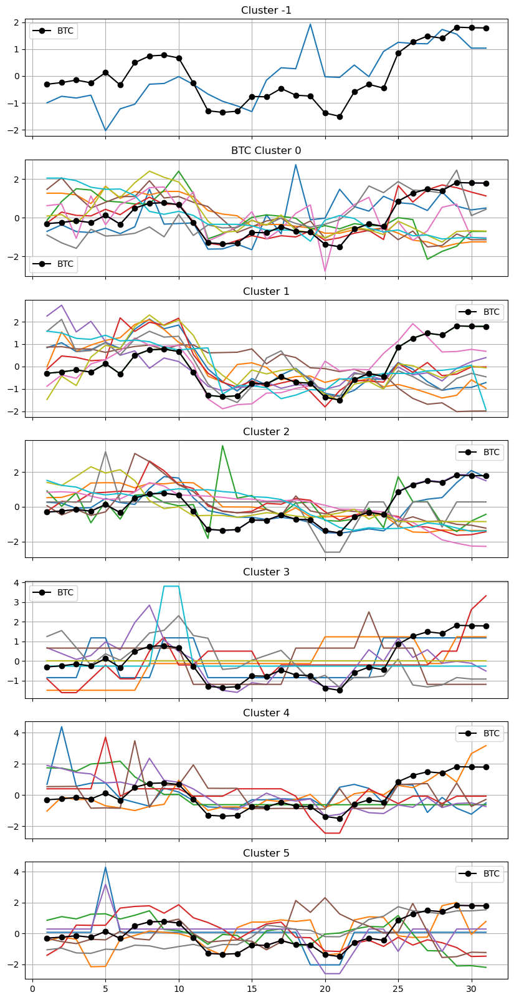

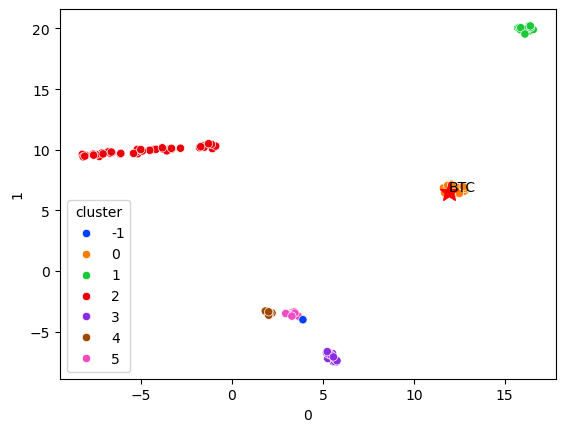

In [129]:
hdbscan = HDBSCAN()

pred_cl = hdbscan.fit_predict(df_hist_red)
s = silhouette_score(df_hist_red, pred_cl)
db = davies_bouldin_score(df_hist_red, pred_cl)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_hist_red,
        df_hist,
        ind_raw,
        # show_cluster=1,
        show_limit=10,
        norm_by_first_val=False
)

Понижение размерностей дало буст в метриках, снизило кол-во "шумных" сэмплов, но опять же не дало пригодного для анализа разбиения

##### Extract and preprocess tsfresh features

Извлечем полный набор фичей tsfresh и сделаем их препроцессинг

In [130]:
df_tsfr = extract_features(
    df_hist,
    column_id='currency',
    column_sort='time_n',
    column_value='price_n',
    default_fc_parameters=ComprehensiveFCParameters(),
    n_jobs=4,
)

Feature Extraction: 100%|██████████| 20/20 [00:11<00:00,  1.71it/s]


In [131]:
df_tsfr_sc, idx_tsfr = preprocess_extracted(
        df_tsfr,
        nan_thresh=0.9,
        fill_na_val=0,
        scaler=StandardScaler,

)

Initial shape: (100, 783)
After drop nans: (100, 430)
After drop singular value cols: (100, 409)
After drop cols with infs: (100, 408)


##### tsfresh+KMeans

Clusters: 2
Inertia: 35151.001784877895
Silhouette score: 0.16254037189226367
Davies-Bouldin score: 2.3202129509867135
Clusters: 3
Inertia: 30888.99683516285
Silhouette score: 0.1851246161120371
Davies-Bouldin score: 1.636320497773557
Clusters: 4
Inertia: 28159.458615959597
Silhouette score: 0.19611428146276136
Davies-Bouldin score: 1.8895764891906688
Clusters: 5
Inertia: 27657.144460265074
Silhouette score: 0.11471849137003484
Davies-Bouldin score: 2.127935528868359
Clusters: 6
Inertia: 26069.39189650897
Silhouette score: 0.14792377048087735
Davies-Bouldin score: 2.0564573579968215
Clusters: 7
Inertia: 25129.709182598817
Silhouette score: 0.13723918389713763
Davies-Bouldin score: 2.1307174982231722
Clusters: 8
Inertia: 23098.356252462145
Silhouette score: 0.12869645653742035
Davies-Bouldin score: 1.7545851543740076
Clusters: 9
Inertia: 22118.600916259176
Silhouette score: 0.1346222917831938
Davies-Bouldin score: 1.6127432382266507
Clusters: 10
Inertia: 21902.23789495106
Silhouette sco

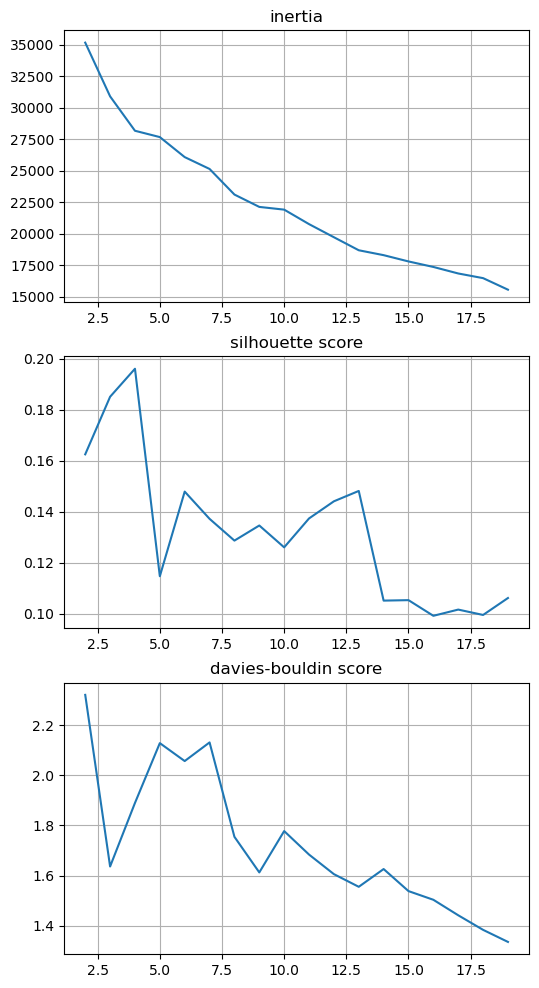

In [132]:
kmeans_adjust(
    df_tsfr_sc,
    max_iter=100,
    max_clusters=20,
    dtw=None,
    seed=SEED,
)

Выберем k=3

Silhouette score: 0.1851246161120371
Davies-Bouldin score: 1.636320497773557
Clusters:
cluster
1    61
0    36
2     3
Name: count, dtype: int64
BTC cluster: 0


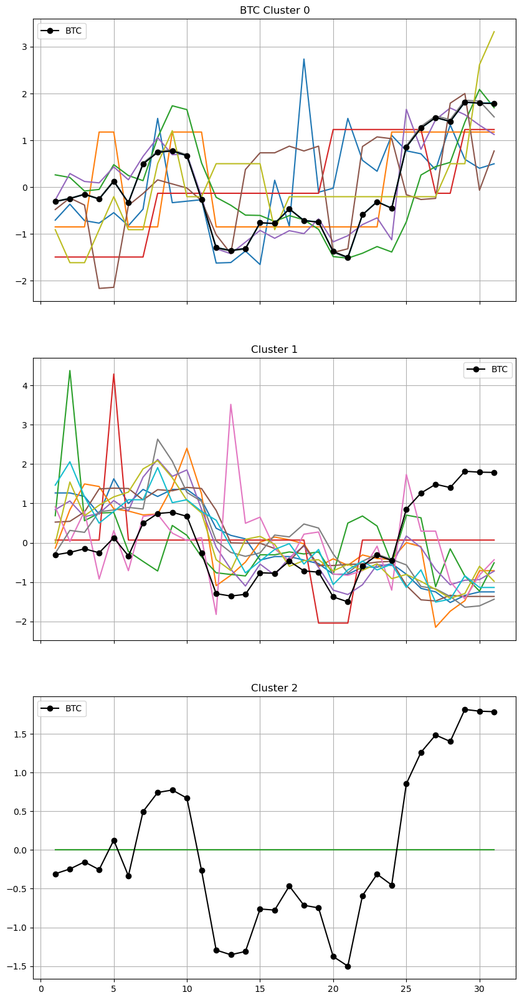

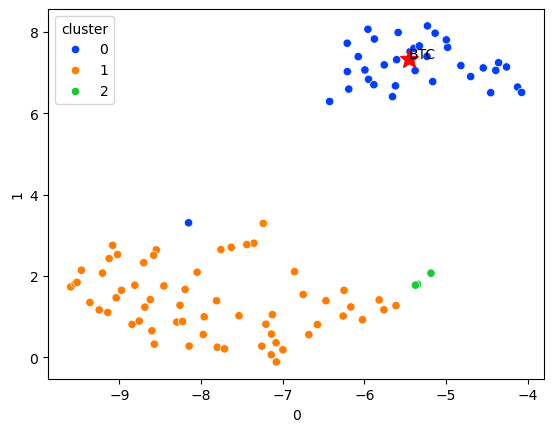

In [133]:
kmeans = KMeans(
    n_clusters=3,
    max_iter=100,
    random_state=SEED
)

pred_cl = kmeans.fit_predict(df_tsfr_sc)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_tsfr_sc,
        df_hist,
        idx_tsfr,
        # show_cluster=0,
        show_limit=10,
        norm_by_first_val=False
)

Несмотря на не очень высокие метрики, визуально KMeans на фичах tsfresh дал более "осмысленные" результаты. Например в 0 кластере, куда попал BTC, в среднем криптовалюты повторяют свой тренд за ценой BTC. Валюты из кластера 1 же напротив - после примерно 24-25 дней не следуют тренду BTC на рост цены. В кластер 2 же вообще попали криптовалюты с неизменной стоимостью. Т.е. можем утверждать, что валюты из 1,2 кластеров отличны от BTC

##### tsfresh+HDBSCAN

Silhouette score: 0.005197923064596057
Davies-Bouldin score: 2.461040648843356
Clusters:
cluster
-1    62
 1    29
 0     9
Name: count, dtype: int64
BTC cluster: 0


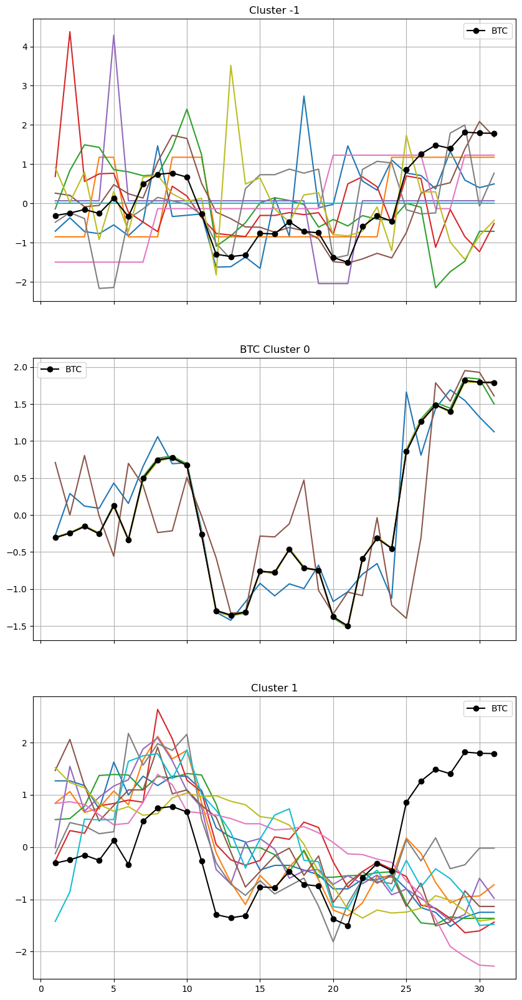

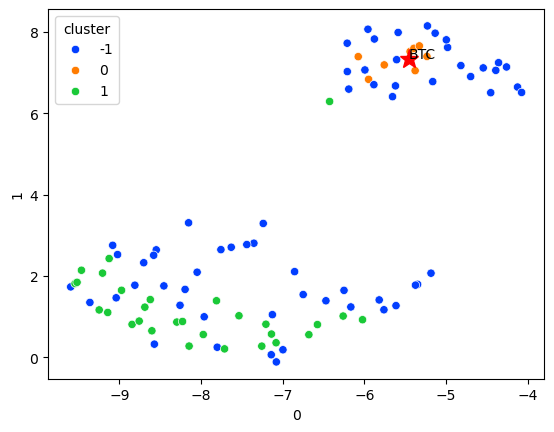

In [134]:
hdbscan = HDBSCAN()

pred_cl = hdbscan.fit_predict(df_tsfr_sc)
s = silhouette_score(df_tsfr_sc, pred_cl)
db = davies_bouldin_score(df_tsfr_sc, pred_cl)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_tsfr_sc,
        df_hist,
        idx_tsfr,
        # show_cluster=1,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

Аглоритм HDBSCAN на фичах tsfresh так же как и KMeans выделил то же количество кластеров (2 кластера + 1 с шумными сэмплами) тех же размеров. Как видно из графиков, в 0 кластер биткоина попали валюты, чья динамика очень прибрижена к BTC. Напротив, валюты кластера 1 имеют явные различия с динамикой BTC, особенно на 24-25 день - курс у них снижаются в отличие от кластера BTC. Криптовалюты из шумного кластера -1 же сложно уверенно отнести к тем, что похожи на BTC или радикально отличаются от него. Пока это лучший алгоритм (несмотря на невыдающиеся метрики)

In [135]:
diff_currs_30d = []
diff_currs_30d.extend(curr_clusters[1])

In [136]:
len(diff_currs_30d)

29

##### Extract and preprocess tsfel features

Извлечем полный набор фичей tsfel

In [137]:
data_tsfel, currencies_tsfel = to_tsfel_format(df_hist)

In [138]:
cfg = tsfel.get_features_by_domain()
df_tsfel = tsfel.time_series_features_extractor(cfg, data_tsfel)

In [139]:
df_tsfel_sc, idx_tsfel = preprocess_extracted(
        df_tsfel,
        nan_thresh=0.9,
        fill_na_val=0,
        scaler=StandardScaler,

)

Initial shape: (100, 140)
After drop nans: (100, 140)
After drop singular value cols: (100, 129)
After drop cols with infs: (100, 129)


##### tsfel+kmeans

Clusters: 2
Inertia: 12276.778644528564
Silhouette score: 0.29959075049861433
Davies-Bouldin score: 2.488289488989345
Clusters: 3
Inertia: 4549.658443755499
Silhouette score: 0.3987008818076969
Davies-Bouldin score: 1.470789320373808
Clusters: 4
Inertia: 4026.3600645580896
Silhouette score: 0.3245230937351737
Davies-Bouldin score: 1.3617272040898287
Clusters: 5
Inertia: 3857.492581514586
Silhouette score: 0.28799260422803447
Davies-Bouldin score: 1.2670187879009915
Clusters: 6
Inertia: 3702.389825001834
Silhouette score: 0.18469597974557467
Davies-Bouldin score: 1.5278720238430408
Clusters: 7
Inertia: 3148.7822974354194
Silhouette score: 0.24471058924116376
Davies-Bouldin score: 1.3508235230552048
Clusters: 8
Inertia: 2911.852435831082
Silhouette score: 0.24052985344409855
Davies-Bouldin score: 1.3201913156674934
Clusters: 9
Inertia: 2796.7557335682645
Silhouette score: 0.20229538658230226
Davies-Bouldin score: 1.470263791699614
Clusters: 10
Inertia: 2632.0211281223287
Silhouette score

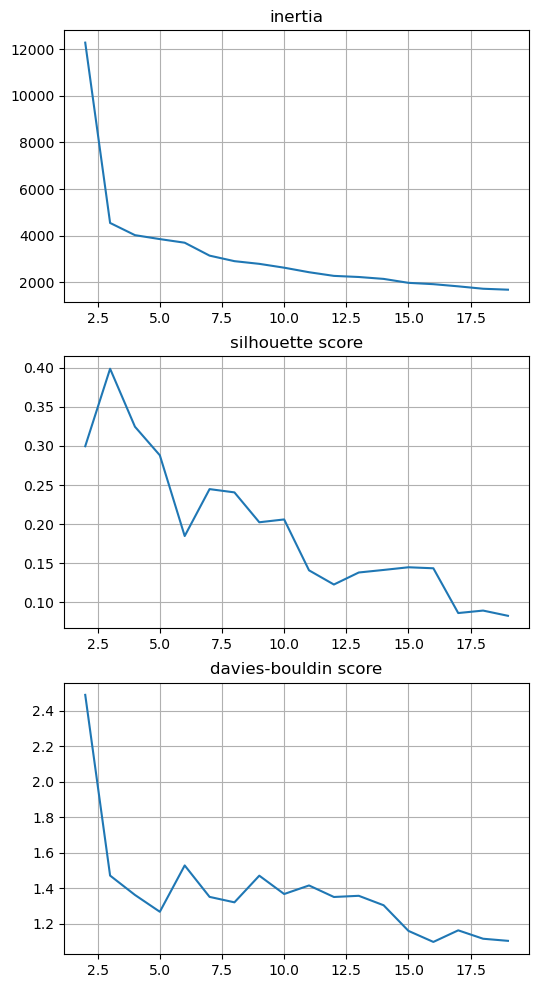

In [140]:
kmeans_adjust(
    df_tsfel_sc,
    max_iter=100,
    max_clusters=20,
    dtw=None,
    seed=SEED,
)

Выберем k=3

Silhouette score: 0.3987008818076969
Davies-Bouldin score: 1.470789320373808
Clusters:
cluster
1    86
0    13
2     1
Name: count, dtype: int64
BTC cluster: 2


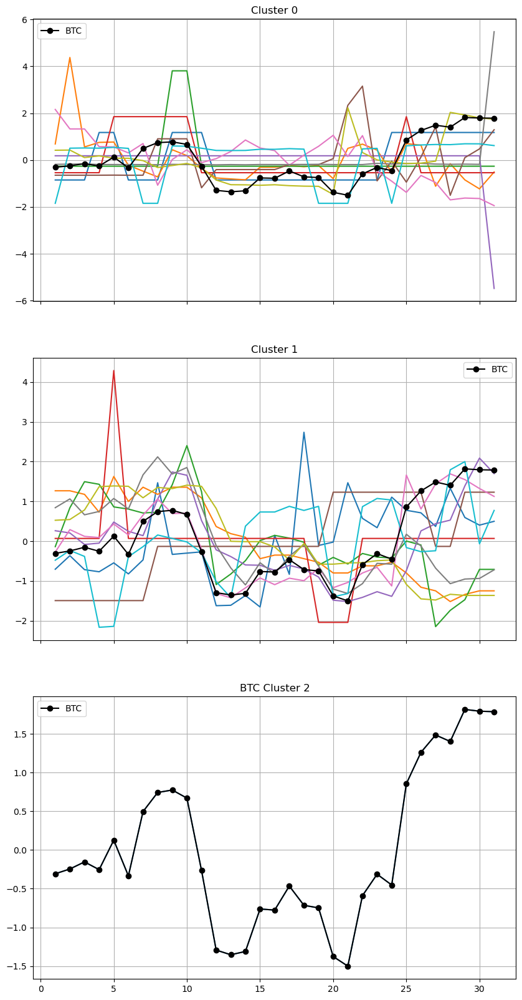

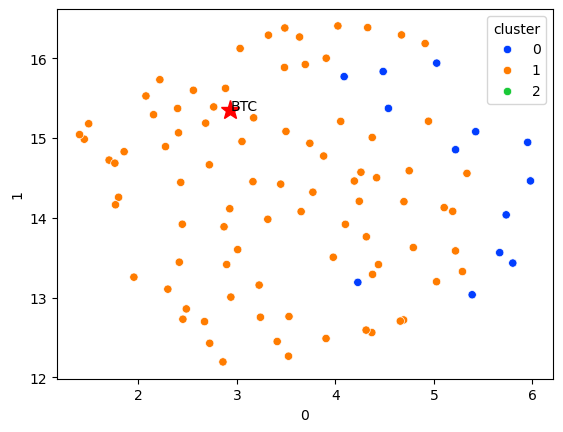

In [141]:
kmeans = KMeans(
    n_clusters=3,
    max_iter=100,
    random_state=SEED
)

pred_cl = kmeans.fit_predict(df_tsfel_sc)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_tsfel_sc,
        df_hist,
        currencies_tsfel,
        # show_cluster=1,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

На фичах tsfel получили низкие метрики, BTC отделяется в отдельный кластер, остальные кластера так же шумные

##### tsfel+HDBSCAN

In [142]:
hdbscan = HDBSCAN()

pred_cl = hdbscan.fit_predict(df_tsfel_sc)
s = silhouette_score(df_tsfel_sc, pred_cl)
db = davies_bouldin_score(df_tsfel_sc, pred_cl)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_tsfel_sc,
        df_hist,
        currencies_tsfel,
        # show_cluster=1,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

In [143]:
pred_cl

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1],
      dtype=int64)

HDBSCAN на фичах tsfel не смог справиться с задачей и выделить кластера

##### raw+KMeans (DTW)

Clusters: 2
Inertia: 2203469.196718466
Silhouette score: 0.9889724305148886
Davies-Bouldin score: 0.0009743376090100729
Clusters: 3
Inertia: 45847.269139670854
Silhouette score: 0.9753603665058028
Davies-Bouldin score: 0.0028382126680989994
Clusters: 4
Inertia: 4053.052105769637
Silhouette score: 0.9618638599970118
Davies-Bouldin score: 0.15997682666367014
Clusters: 5
Inertia: 250.94721076963617
Silhouette score: 0.9527438661396113
Davies-Bouldin score: 0.0033254020842934822
Clusters: 6
Inertia: 39.717853927363564
Silhouette score: 0.9063780248242952
Davies-Bouldin score: 0.13420217761253497
Clusters: 7
Inertia: 8.50526663007405
Silhouette score: 0.8987131494733859
Davies-Bouldin score: 0.15805834300262064
Clusters: 8
Inertia: 4.441608203572219
Silhouette score: 0.8907962182976078
Davies-Bouldin score: 0.09224050791777046
Clusters: 9
Inertia: 3.1385712735431692
Silhouette score: 0.8740999303562549
Davies-Bouldin score: 0.10297679972587316
Clusters: 10
Inertia: 0.44551271608241566
Silho

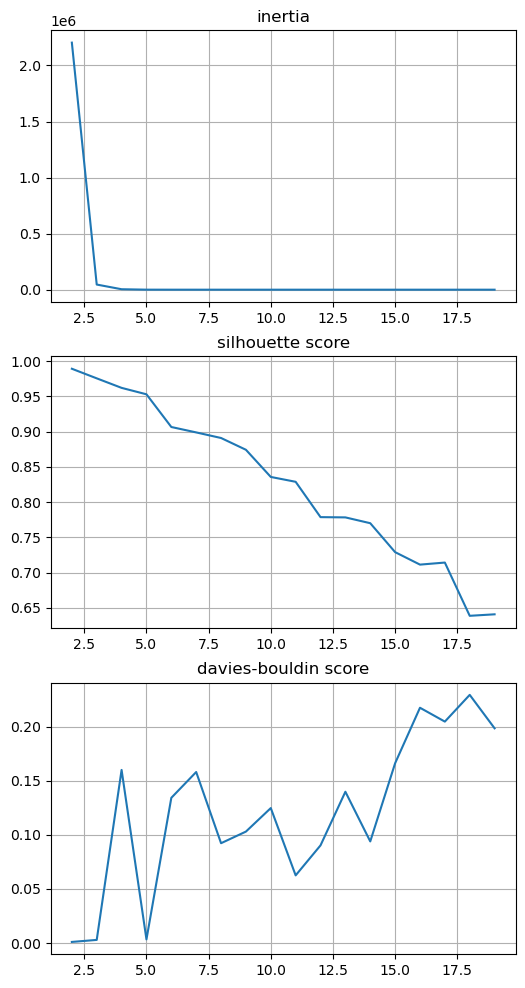

In [144]:
kmeans_adjust(
    df_hist_raw,
    max_iter=100,
    max_clusters=20,
    dtw='dtw',
    seed=SEED,
)

Выберем k=5

Silhouette score: 0.9527438661396113
Davies-Bouldin score: 0.0033254020842934822
Clusters:
cluster
0    96
4     1
1     1
3     1
2     1
Name: count, dtype: int64
BTC cluster: 1


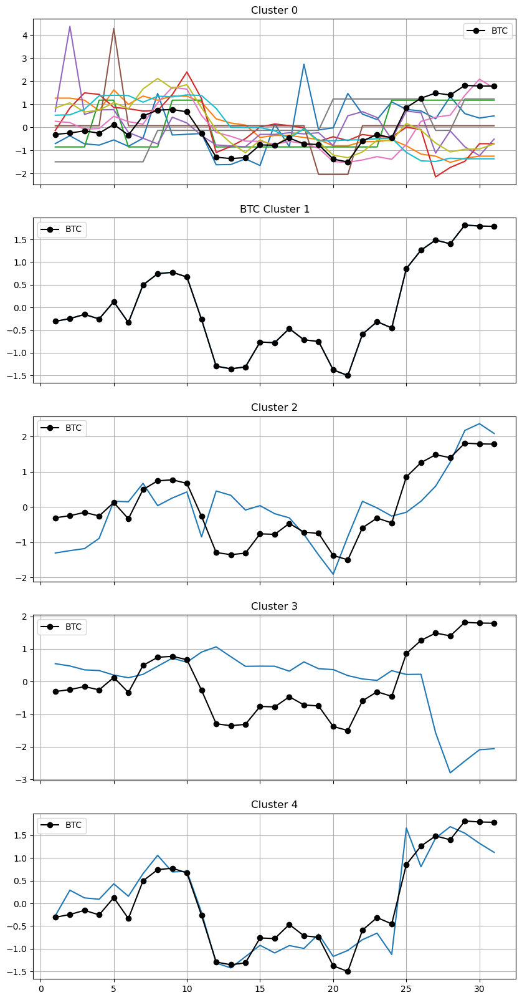

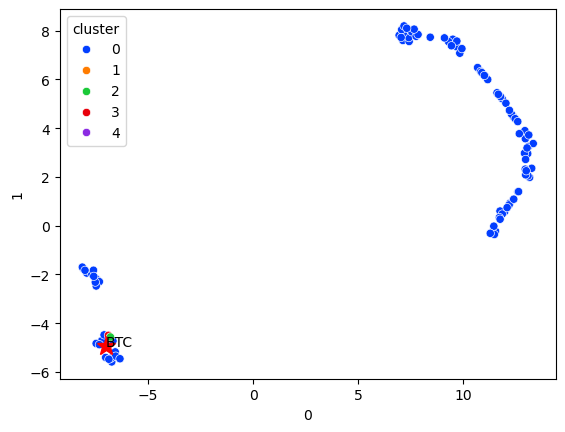

In [145]:
kmeans = TimeSeriesKMeans(
                                n_clusters=5, 
                                metric="dtw",
                                max_iter=100, 
                                random_state=SEED
                                )

pred_cl = kmeans.fit_predict(df_hist_raw)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_hist_raw,
        df_hist,
        df_hist_raw.index,
        # show_cluster=2,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

Как и в остальных случаях с кластеризацией на исходных рядах для KMeans на основе метрики DTW BTC отделяется в отдельный кластер, а большая часть в другой, что не очень пригодно для анализа

##### raw+KMeans (softDTW)

Clusters: 2
Inertia: 456266669315382.3
Silhouette score: 0.9889724305148886
Davies-Bouldin score: 0.0009743376090100729
Clusters: 3
Inertia: 130919799178.2083
Silhouette score: 0.9753603665058028
Davies-Bouldin score: 0.0028382126680989994
Clusters: 4
Inertia: 596421741.3169584
Silhouette score: 0.9618638599970118
Davies-Bouldin score: 0.15997682666367014
Clusters: 5
Inertia: 2463163.606389402
Silhouette score: 0.9527438661396113
Davies-Bouldin score: 0.0033254020842934814
Clusters: 6
Inertia: 36943.14184207758
Silhouette score: 0.9063780248242952
Davies-Bouldin score: 0.13420217761253497
Clusters: 7
Inertia: 2328.716439499681
Silhouette score: 0.8987131494733859
Davies-Bouldin score: 0.15805834300262064
Clusters: 8
Inertia: 2245.097375562499
Silhouette score: 0.8907962182976078
Davies-Bouldin score: 0.09224050791777044
Clusters: 9
Inertia: 2168.6642079978965
Silhouette score: 0.8740999303562549
Davies-Bouldin score: 0.10297679972587316


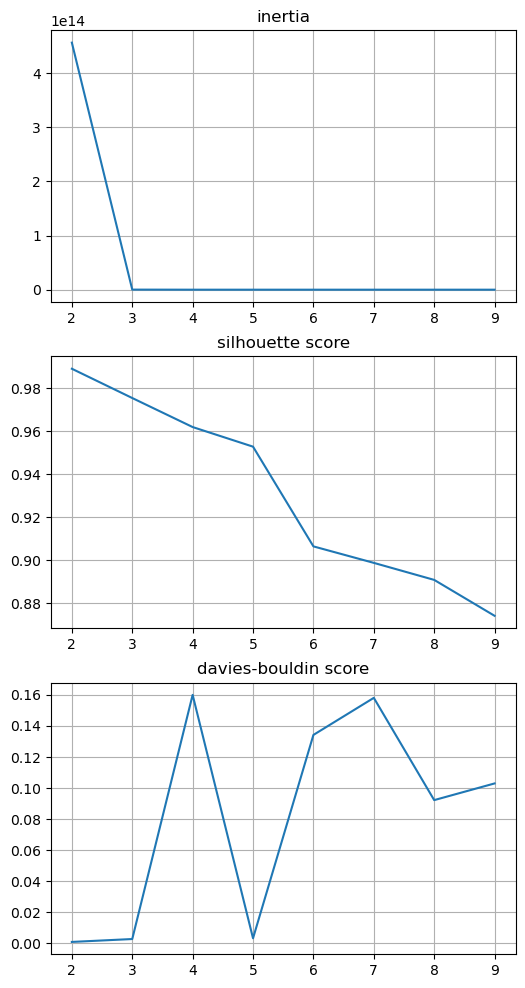

In [146]:
kmeans_adjust(
    df_hist_raw,
    max_iter=100,
    max_clusters=10,
    dtw='softdtw',
    seed=SEED,
)

Silhouette score: 0.9753603665058028
Davies-Bouldin score: 0.0028382126680989994
Clusters:
cluster
0    98
1     1
2     1
Name: count, dtype: int64
BTC cluster: 1


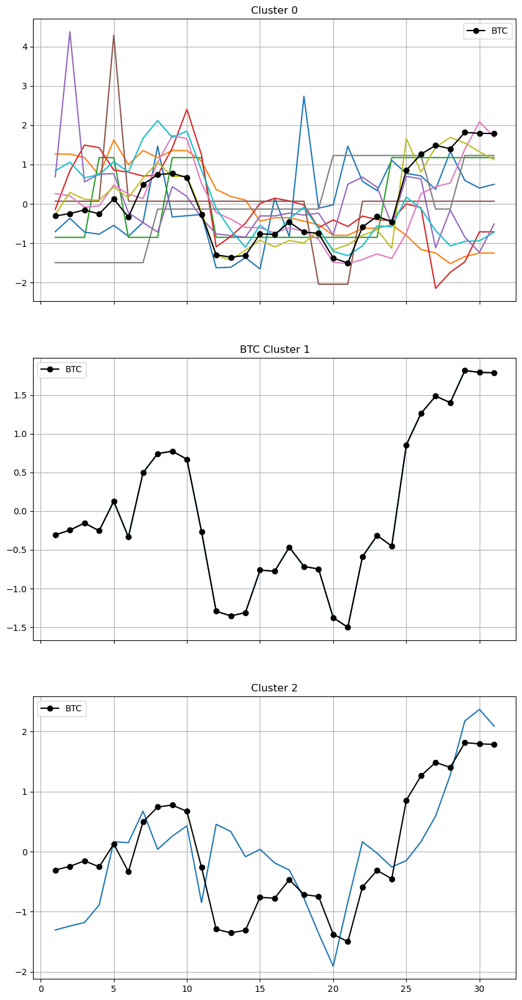

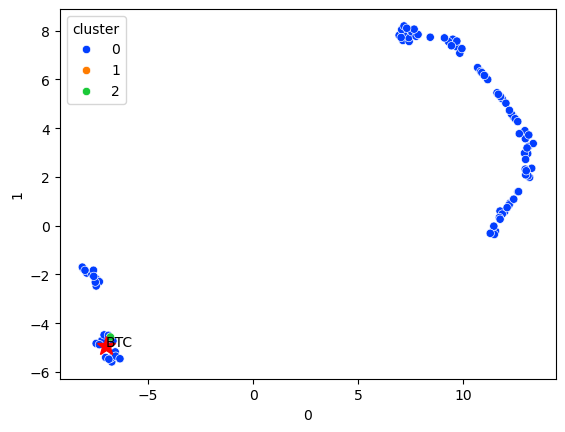

In [147]:
kmeans = TimeSeriesKMeans(
                                n_clusters=3, 
                                metric="softdtw",
                                max_iter=100, 
                                random_state=SEED
                                )

pred_cl = kmeans.fit_predict(df_hist_raw)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_hist_raw,
        df_hist,
        df_hist_raw.index,
        # show_cluster=2,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

То же результат, что и в случае Kmeans на основе DTW

##### Summary


1. Наилучшим подходом стала кластеризация на фичах tsfresh (причем иерархический HDBSCAN даёт более точные с т.з. анализа криптовалюты кластера). Судя по всему, именно в каких-то из них (около 400 шт.) содержится значимые закономерности.
1. Кластеризация на исходных масштабированных временных рядах (HDBSCAN, Kmeans на основе евклидовой метрики и DTW) и фичах tsfel,  работает плохо, т.к. не позволяет сделать осмысленные кластеры, зачастую изолирует BTC в отдельный кластер.
1. Можно понизить "размерность" исходного ряда и получить немного лучшие результаты кластеризации (видимо, за счёт эффективного снижения зашумленности)

Список криптовалют, отличных от кластера BTC (на основе tsfresh+HDBSCAN)

In [148]:
diff_currs_30d

['AEUR',
 'BICO',
 'BIST',
 'BSCPAD',
 'BSSB',
 'CEUR',
 'CHER',
 'DAO',
 'DOGA',
 'FCON',
 'FER',
 'HPO',
 'ICP',
 'IVEX',
 'JETTON',
 'KGC',
 'LPM',
 'OCH',
 'ORAI',
 'PART',
 'PBUX',
 'PEARL',
 'QLC',
 'THE9',
 'VISION',
 'VTHO',
 'XCUR',
 'XPR',
 'XVG']

#### 3 days history with 1 hour interval

##### Load

In [149]:
df_hist = pd.read_csv('./data/price_hist_3d.csv')

In [150]:
df_hist = df_hist.sort_values(['currency', 'time'], ascending=True)
df_hist = df_hist.assign(time_n=df_hist.groupby(['currency']).cumcount().add(1))

Выведем несколько временнных рядов, отнормированных на начальное значение, в сравнение с биткоином

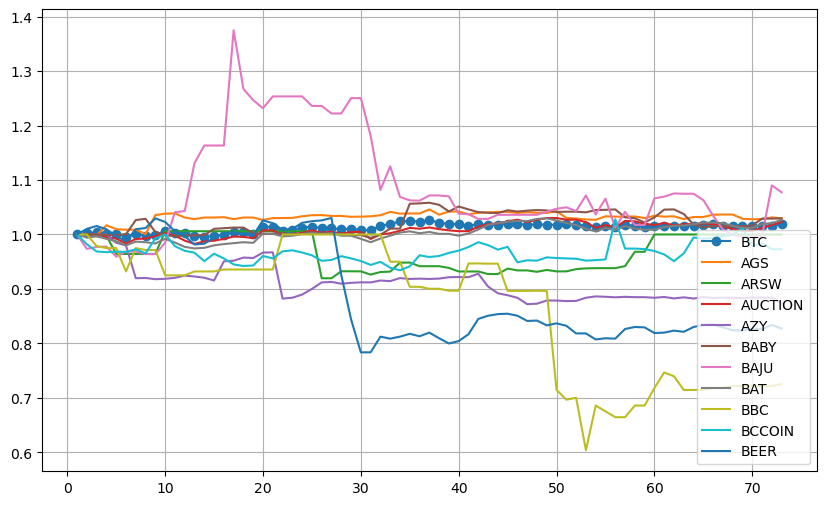

In [151]:
show_lim = 10
curr_list_show = ['BTC']
curr_list_show.extend(list(df_hist.currency.unique()[:show_lim]))

fig, ax = plt.subplots(1, figsize=(10,6))
for currency in curr_list_show:
    ls = 'o-' if currency == 'BTC' else '-'
    vals = df_hist.query(f'currency == "{currency}"').reset_index(drop=True)
    ax.plot(vals.time_n, vals.price / (vals.query('time_n == 1').price.values[0] + 1e-20), ls, label=currency)
    ax.legend()
    ax.grid(True)
plt.show();

##### Scale time series

In [152]:
df_hist = scale_ts(df_hist, StandardScaler)

##### Raw format

Исходные данные приводятся к необходимому для кластеризации виду

In [153]:
df_hist_raw = df_hist.pivot(index='currency', columns='time_n', values='price')

In [154]:
ind_raw = df_hist_raw.index

##### raw+KMeans

Clusters: 2
Inertia: 6855769.848446433
Silhouette score: 0.9898606608127642
Davies-Bouldin score: 0.000127731339843577
Clusters: 3
Inertia: 505074.78214272985
Silhouette score: 0.9729346071100713
Davies-Bouldin score: 0.18425204130880882
Clusters: 4
Inertia: 27839.250092729922
Silhouette score: 0.9626142217268822
Davies-Bouldin score: 0.0040714840718420525
Clusters: 5
Inertia: 6508.804299628324
Silhouette score: 0.8972179182620375
Davies-Bouldin score: 0.1009198085963408
Clusters: 6
Inertia: 3074.3683131606595
Silhouette score: 0.8586452338309535
Davies-Bouldin score: 0.18974860534130136
Clusters: 7
Inertia: 1761.7388569411376
Silhouette score: 0.7940511948566159
Davies-Bouldin score: 0.3243521723058445
Clusters: 8
Inertia: 708.5492515993152
Silhouette score: 0.7829272197930153
Davies-Bouldin score: 0.2531662794333813
Clusters: 9
Inertia: 405.30715159931697
Silhouette score: 0.7774664716988144
Davies-Bouldin score: 0.17681803252190076
Clusters: 10
Inertia: 261.3746977541675
Silhouette 

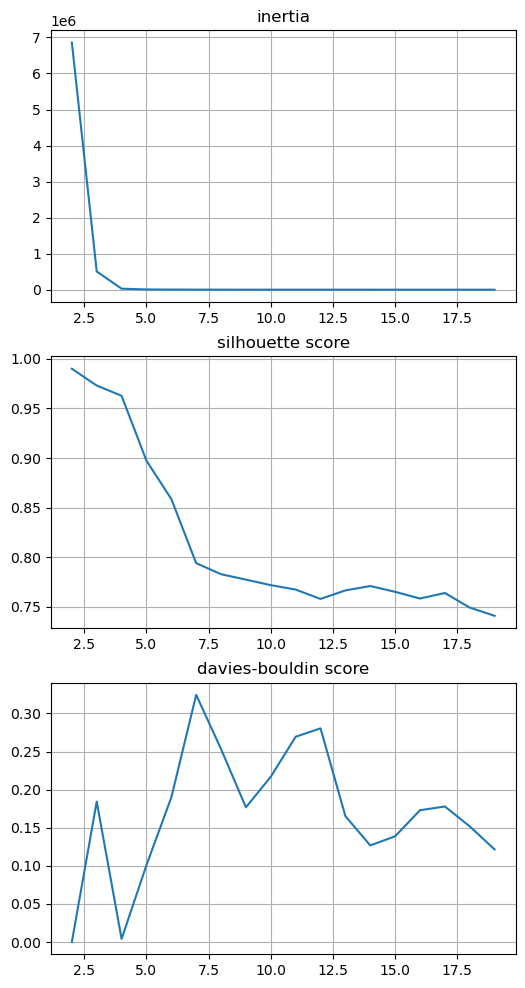

In [155]:
kmeans_adjust(
    df_hist_raw,
    max_iter=100,
    max_clusters=20,
    dtw=None,
    seed=SEED,
)

Выберем k=4

Silhouette score: 0.9626142217268822
Davies-Bouldin score: 0.0040714840718420525
Clusters:
cluster
0    97
1     1
2     1
3     1
Name: count, dtype: int64
BTC cluster: 1


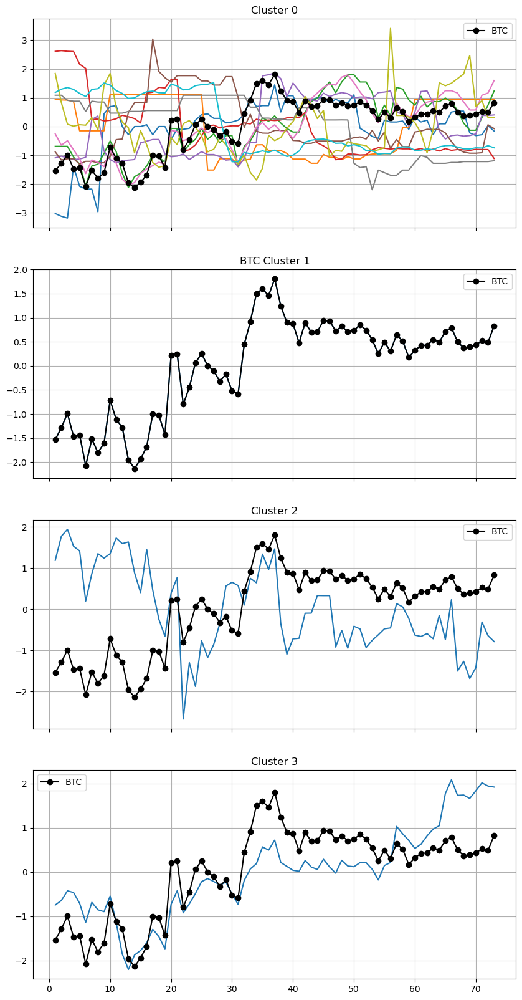

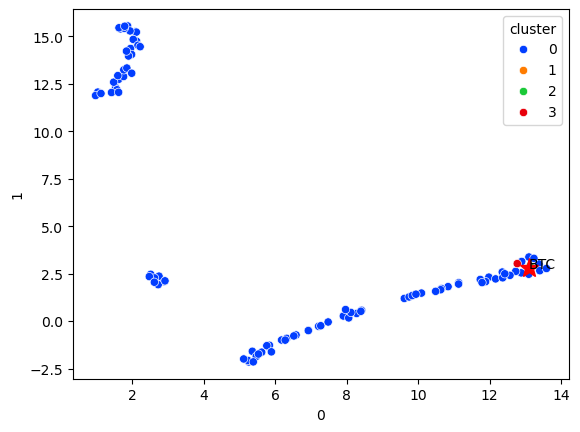

In [156]:
kmeans = KMeans(
    n_clusters=4,
    max_iter=100,
    random_state=SEED
)

pred_cl = kmeans.fit_predict(df_hist_raw)

curr_clusters = evaluate_clustering(
                                    pred_cl,
                                    df_hist_raw,
                                    df_hist,
                                    df_hist_raw.index,
                                    # show_cluster=0,
                                    show_limit=10,
                                    norm_by_first_val=False,
                                    random_state=SEED
                            )

Несмотря на неплохие метрики, KMeans на исходных данных не способен хорошо разделить временные ряды по группам, почти все криптовалюты складываются в один кластер, а BTC оказывается стоять особняком в отдельном кластере. Ситуация аналогична для других значений k

##### dimension reduction+raw+KMeans

Теперь снизим размерность исходных рядов до 5 компонент

In [157]:
umap_model = umap.UMAP(n_components=5, random_state=SEED)
df_hist_red = umap_model.fit_transform(df_hist_raw)
df_hist_red = pd.DataFrame(df_hist_red, index=df_hist_raw.index)

Clusters: 2
Inertia: 734.7020263671875
Silhouette score: 0.8192775249481201
Davies-Bouldin score: 0.27226619058986673
Clusters: 3
Inertia: 613.7543334960938
Silhouette score: 0.7128190398216248
Davies-Bouldin score: 0.463936203363199
Clusters: 4
Inertia: 166.31063842773438
Silhouette score: 0.6352306604385376
Davies-Bouldin score: 0.5167213732991847
Clusters: 5
Inertia: 101.03480529785156
Silhouette score: 0.607407808303833
Davies-Bouldin score: 0.5331342218479664
Clusters: 6
Inertia: 62.84512710571289
Silhouette score: 0.6603758931159973
Davies-Bouldin score: 0.43219794991896204
Clusters: 7
Inertia: 38.94451141357422
Silhouette score: 0.6492834687232971
Davies-Bouldin score: 0.4319567829693069
Clusters: 8
Inertia: 35.166481018066406
Silhouette score: 0.6225231885910034
Davies-Bouldin score: 0.4695749008800436
Clusters: 9
Inertia: 26.99828338623047
Silhouette score: 0.6218743324279785
Davies-Bouldin score: 0.4664785748826785
Clusters: 10
Inertia: 18.529605865478516
Silhouette score: 0.

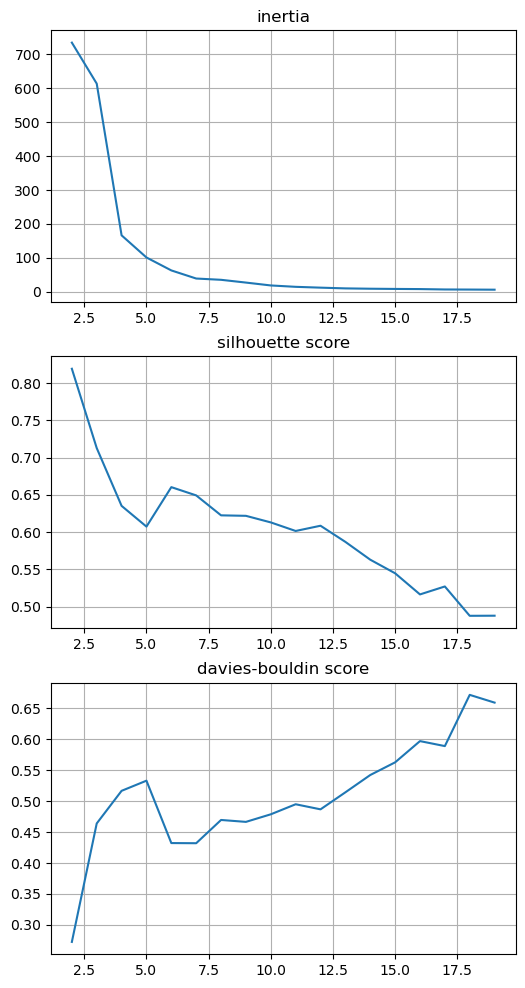

In [158]:
kmeans_adjust(
    df_hist_red,
    max_iter=100,
    max_clusters=20,
    dtw=None,
    seed=SEED,
)

Выберем k=4

Silhouette score: 0.6352306604385376
Davies-Bouldin score: 0.5167213732991847
Clusters:
cluster
0    33
3    29
2    19
1    19
Name: count, dtype: int64
BTC cluster: 0


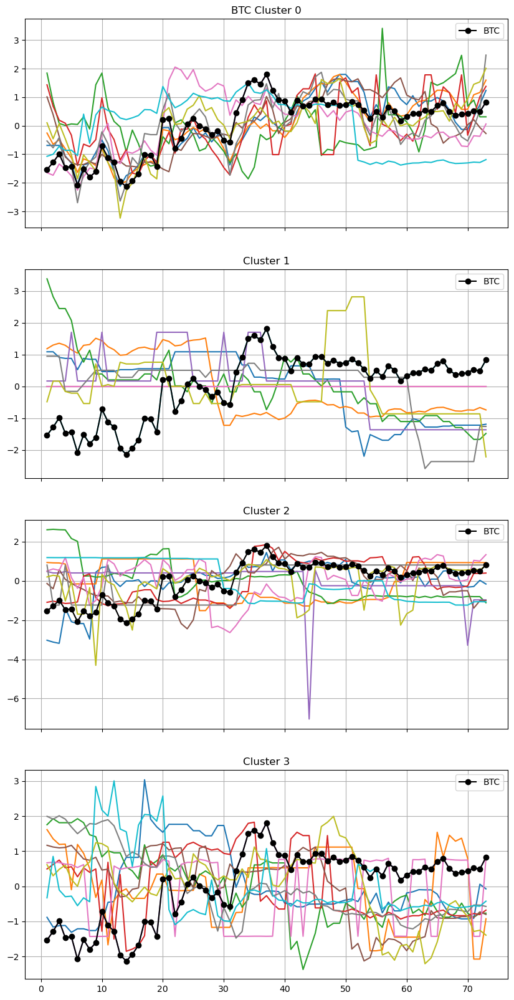

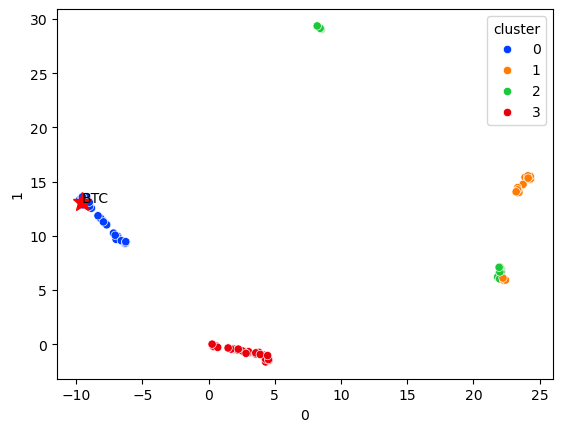

In [159]:
kmeans = KMeans(
    n_clusters=4,
    max_iter=100,
    random_state=SEED
)

pred_cl = kmeans.fit_predict(df_hist_red)

curr_clusters = evaluate_clustering(
                                    pred_cl,
                                    df_hist_red,
                                    df_hist,
                                    df_hist_red.index,
                                    # show_cluster=1,
                                    show_limit=10,
                                    norm_by_first_val=False,
                                    random_state=SEED
                            )

Понижение размерности позволило разбить ряды на более сбалансированные по размеру кластера. Из графиков выше очевидно что кластера получаются слишком шумными (что отражается в более низких метриках). Несмотря на это, например, можно отметить  кластер 1, где в среднем наблюдается отличная от BTC динамика (общее снижение)

##### raw+HDBSCAN

Silhouette score: -0.046131407382500225
Davies-Bouldin score: 1.9442073151620078
Clusters:
cluster
-1    48
 3    30
 2     8
 1     8
 0     6
Name: count, dtype: int64
BTC cluster: -1


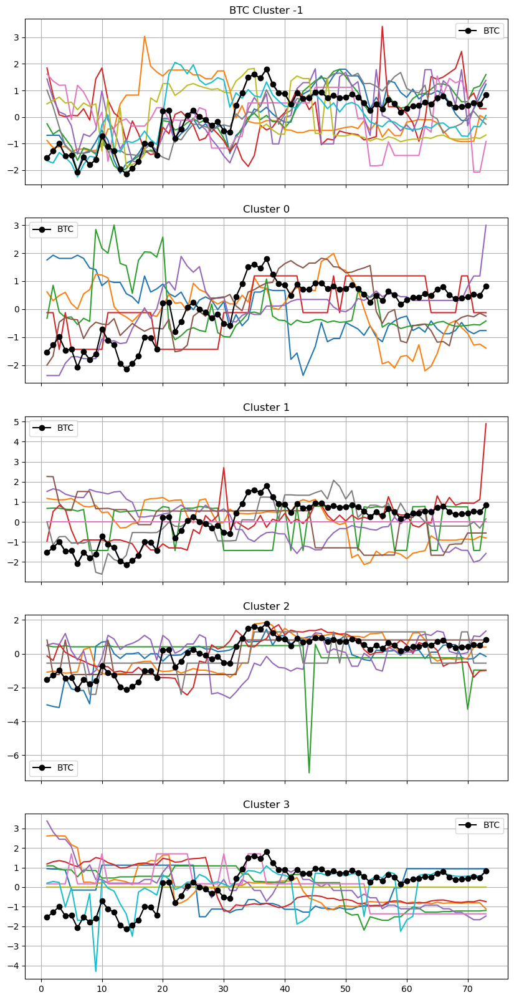

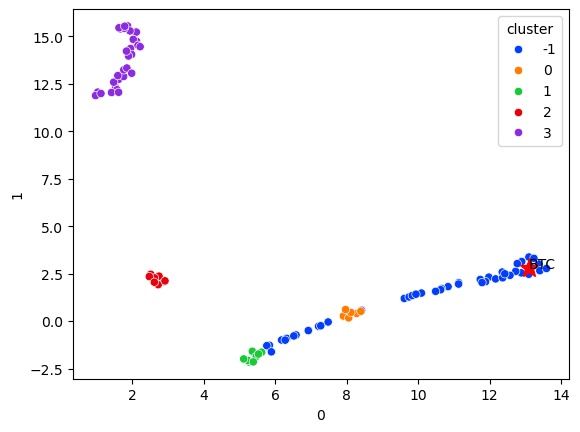

In [160]:
hdbscan = HDBSCAN()

pred_cl = hdbscan.fit_predict(df_hist_raw)
s = silhouette_score(df_hist_raw, pred_cl)
db = davies_bouldin_score(df_hist_raw, pred_cl)

curr_clusters = evaluate_clustering(
                                        pred_cl,
                                        df_hist_raw,
                                        df_hist,
                                        ind_raw,
                                        # show_cluster=1,
                                        show_limit=10,
                                        norm_by_first_val=False,
                                        random_state=SEED
                                )

Алгоритм иерархической кластеризации HDBSCAN на исходных данных дал слишком шумные кластера, сложные для визуального анализа

##### dimension reduction+raw+HDBSCAN

Теперь снизим размерность исходных рядов до 5 компонент

In [161]:
umap_model = umap.UMAP(n_components=5, random_state=SEED)
df_hist_red = umap_model.fit_transform(df_hist_raw)
df_hist_red = pd.DataFrame(df_hist_red, index=df_hist_raw.index)

Silhouette score: 0.7656508088111877
Davies-Bouldin score: 0.3191225883868192
Clusters:
cluster
0    62
3    16
2    14
1     8
Name: count, dtype: int64
BTC cluster: 0


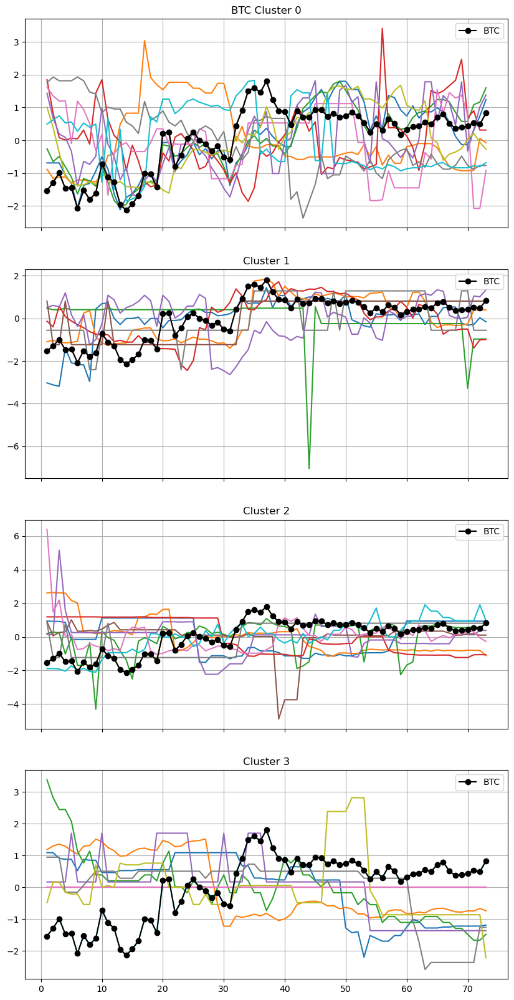

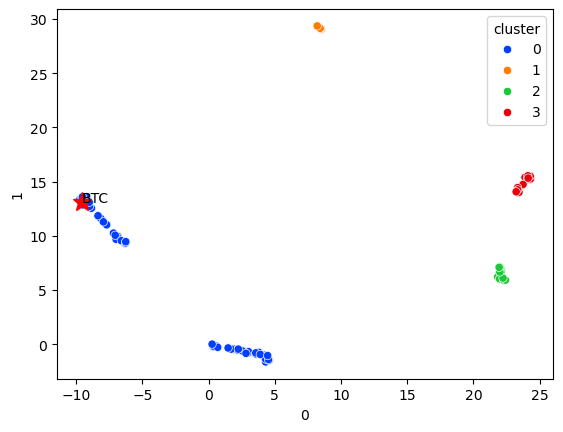

In [162]:
hdbscan = HDBSCAN()

pred_cl = hdbscan.fit_predict(df_hist_red)
s = silhouette_score(df_hist_red, pred_cl)
db = davies_bouldin_score(df_hist_red, pred_cl)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_hist_red,
        df_hist,
        ind_raw,
        # show_cluster=1,
        show_limit=10,
        norm_by_first_val=False
)

Понижение размерностей дало буст в метриках, снизило кол-во "шумных" сэмплов + получили кластер 3, где очевидно отличие общей динамики от BTC

##### Extract and preprocess tsfresh features

Извлечем полный набор фичей tsfresh и сделаем их препроцессинг

In [163]:
df_tsfr = extract_features(
    df_hist,
    column_id='currency',
    column_sort='time_n',
    column_value='price_n',
    default_fc_parameters=ComprehensiveFCParameters(),
    n_jobs=4,
)

Feature Extraction: 100%|██████████| 20/20 [00:11<00:00,  1.80it/s]


In [164]:
df_tsfr_sc, idx_tsfr = preprocess_extracted(
        df_tsfr,
        nan_thresh=0.9,
        fill_na_val=0,
        scaler=StandardScaler,

)

Initial shape: (100, 783)
After drop nans: (100, 530)
After drop singular value cols: (100, 508)
After drop cols with infs: (100, 508)


##### tsfresh+KMeans

Clusters: 2
Inertia: 43047.028332375776
Silhouette score: 0.2637763427496848
Davies-Bouldin score: 0.9060452638827307
Clusters: 3
Inertia: 36485.370481645004
Silhouette score: 0.21524036938741922
Davies-Bouldin score: 1.793536766649814
Clusters: 4
Inertia: 34432.27115370189
Silhouette score: 0.203270043910449
Davies-Bouldin score: 2.092485418680813
Clusters: 5
Inertia: 33312.249785488835
Silhouette score: 0.17149611795366337
Davies-Bouldin score: 2.356257630245468
Clusters: 6
Inertia: 32745.80913506402
Silhouette score: 0.15462157918703645
Davies-Bouldin score: 2.3216349317081604
Clusters: 7
Inertia: 30558.03640029391
Silhouette score: 0.16954173077158796
Davies-Bouldin score: 2.2240667588320804
Clusters: 8
Inertia: 28801.490280067785
Silhouette score: 0.14704797251613225
Davies-Bouldin score: 2.071530110984983
Clusters: 9
Inertia: 28003.186674820266
Silhouette score: 0.14547658439880976
Davies-Bouldin score: 2.1001236049948253
Clusters: 10
Inertia: 27461.04943423805
Silhouette score: 

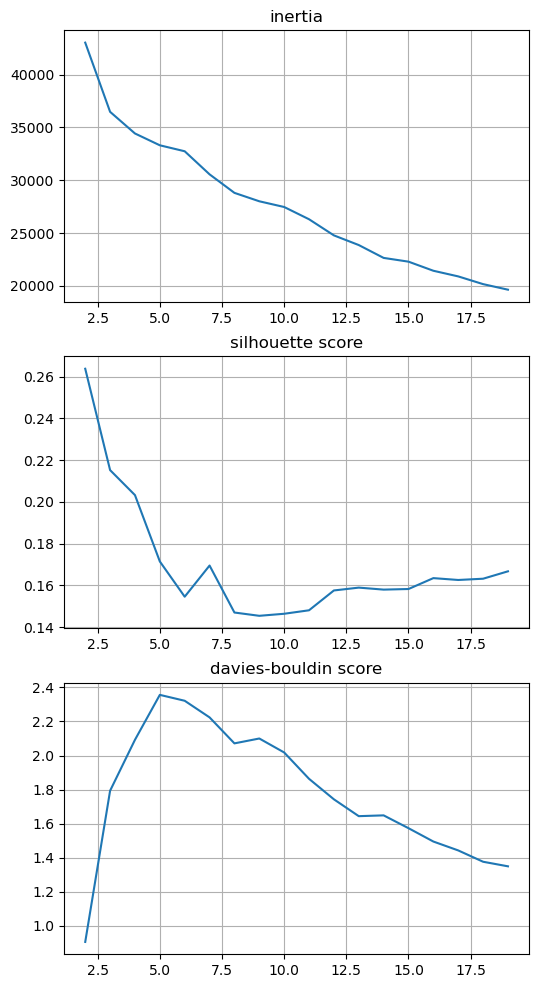

In [165]:
kmeans_adjust(
    df_tsfr_sc,
    max_iter=100,
    max_clusters=20,
    dtw=None,
    seed=SEED,
)

Выберем k=3

Silhouette score: 0.21524036938741922
Davies-Bouldin score: 1.793536766649814
Clusters:
cluster
2    53
0    38
1     9
Name: count, dtype: int64
BTC cluster: 2


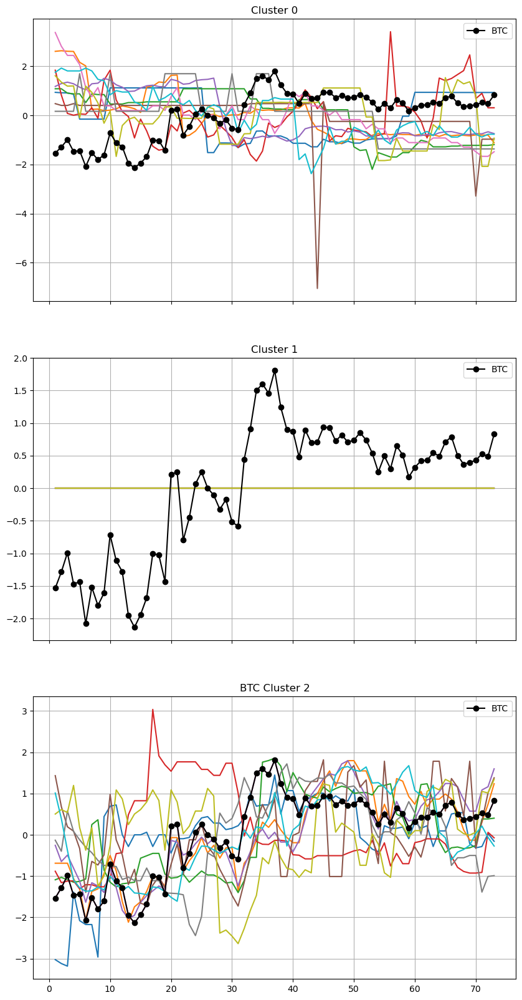

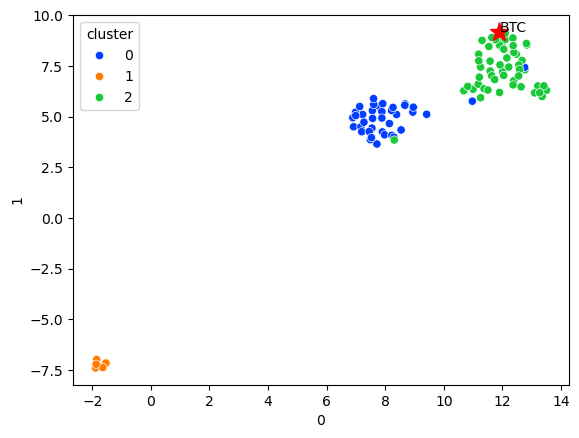

In [166]:
kmeans = KMeans(
    n_clusters=3,
    max_iter=100,
    random_state=SEED
)

pred_cl = kmeans.fit_predict(df_tsfr_sc)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_tsfr_sc,
        df_hist,
        idx_tsfr,
        # show_cluster=0,
        show_limit=10,
        norm_by_first_val=False
)

Несмотря на то, что кластеры получились шумные, можно визуально отследить, что 0 кластер имеет отличающуюся от BTC динамику в среднем (тренд на снижение). Также в 1 кластер выделились валюты с неизменной ценой, а валюты кластера 2 так же в среднем имеют схожую с BTC динамику

##### tsfresh+HDBSCAN

Silhouette score: 0.15921429281571148
Davies-Bouldin score: 2.0905305838632495
Clusters:
cluster
-1    40
 2    32
 3    14
 0     9
 1     5
Name: count, dtype: int64
BTC cluster: 2


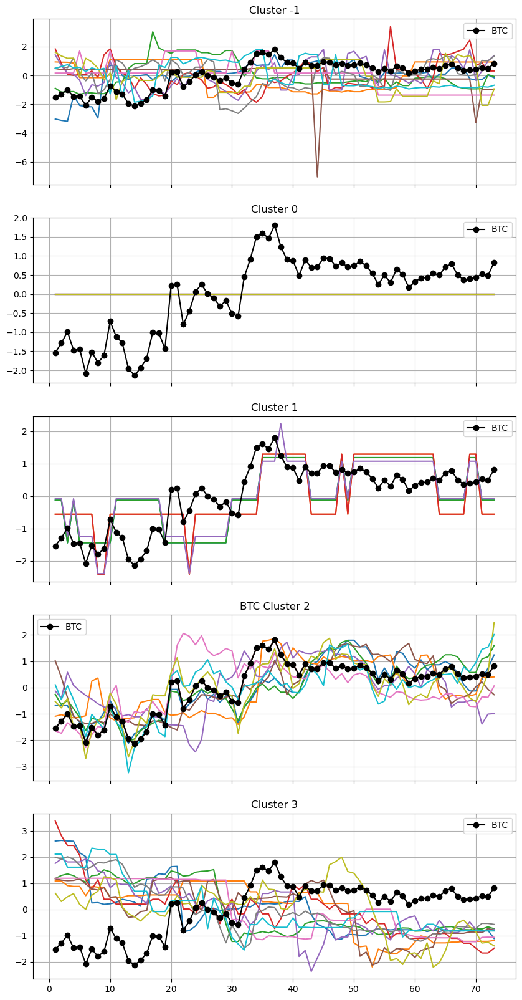

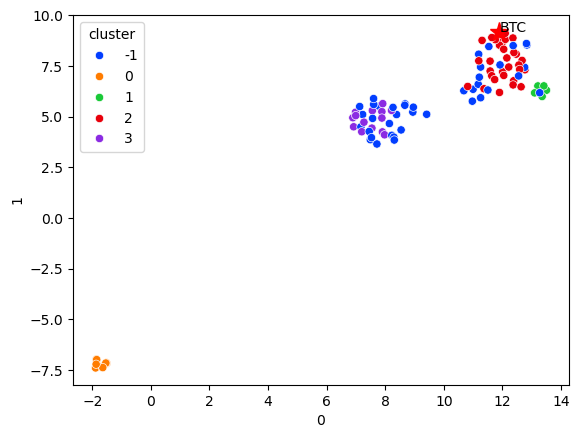

In [167]:
hdbscan = HDBSCAN()

pred_cl = hdbscan.fit_predict(df_tsfr_sc)
s = silhouette_score(df_tsfr_sc, pred_cl)
db = davies_bouldin_score(df_tsfr_sc, pred_cl)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_tsfr_sc,
        df_hist,
        idx_tsfr,
        # show_cluster=1,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

Как и впрошлом случае, связка tsfresh+HDBSCAN даёт осмысленное разделение на кластеры (куда входят валюты со схожей динамикой)
Помимо шума в кластере -1 можно выделить криптовалюты кластеров 0,1,3, чья динамика отличается от кластера BTC (2)

In [168]:
diff_currs_3d = []
diff_currs_3d.extend(curr_clusters[0])
diff_currs_3d.extend(curr_clusters[1])
diff_currs_3d.extend(curr_clusters[3])

In [169]:
len(diff_currs_3d)

28

##### Extract and preprocess tsfel features

Извлечем полный набор фичей tsfel

In [170]:
data_tsfel, currencies_tsfel = to_tsfel_format(df_hist)

In [171]:
cfg = tsfel.get_features_by_domain()
df_tsfel = tsfel.time_series_features_extractor(cfg, data_tsfel)

In [172]:
df_tsfel_sc, idx_tsfel = preprocess_extracted(
        df_tsfel,
        nan_thresh=0.9,
        fill_na_val=0,
        scaler=StandardScaler,

)

Initial shape: (100, 156)
After drop nans: (100, 156)
After drop singular value cols: (100, 143)
After drop cols with infs: (100, 143)


##### tsfel+kmeans

Clusters: 2
Inertia: 13560.706329466902
Silhouette score: 0.12358619722121418
Davies-Bouldin score: 1.6361450905007773
Clusters: 3
Inertia: 4503.467979708851
Silhouette score: 0.15716908968194365
Davies-Bouldin score: 1.842694832512061
Clusters: 4
Inertia: 3894.1675244733374
Silhouette score: 0.22260410463848865
Davies-Bouldin score: 1.690814132238283
Clusters: 5
Inertia: 3418.82188564287
Silhouette score: 0.1811997921068267
Davies-Bouldin score: 1.3912240130443867
Clusters: 6
Inertia: 3215.323035189718
Silhouette score: 0.14333348661167808
Davies-Bouldin score: 1.526625883711515
Clusters: 7
Inertia: 2839.105464651775
Silhouette score: 0.17504942607855983
Davies-Bouldin score: 1.1729623174610182
Clusters: 8
Inertia: 2766.532208724568
Silhouette score: 0.15645434455404936
Davies-Bouldin score: 1.5439384057507164
Clusters: 9
Inertia: 2570.61289102146
Silhouette score: 0.15741170297538326
Davies-Bouldin score: 1.4826284107151457
Clusters: 10
Inertia: 2140.507281129044
Silhouette score: 0.

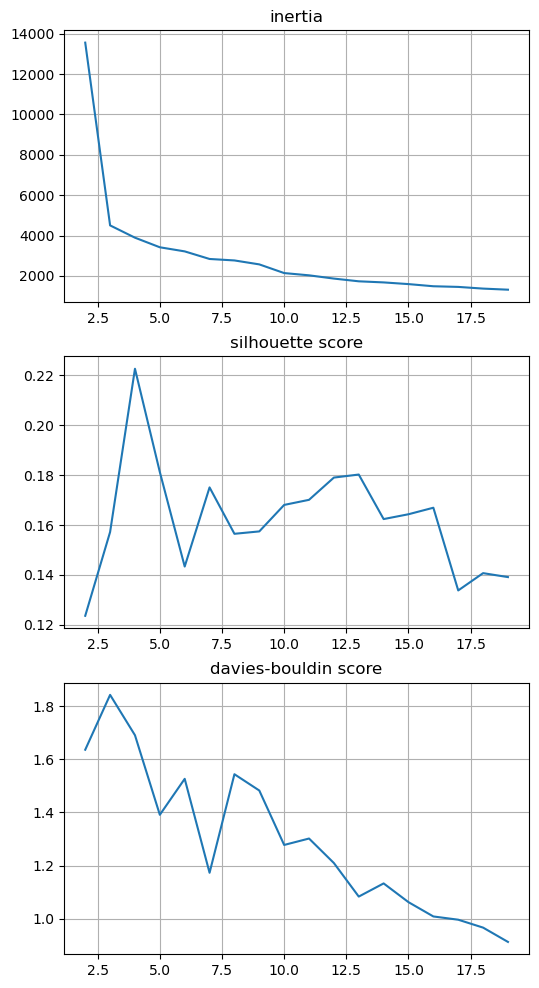

In [173]:
kmeans_adjust(
    df_tsfel_sc,
    max_iter=100,
    max_clusters=20,
    dtw=None,
    seed=SEED,
)

Выберем k=3

Silhouette score: 0.15716908968194365
Davies-Bouldin score: 1.842694832512061
Clusters:
cluster
0    61
2    38
1     1
Name: count, dtype: int64
BTC cluster: 1


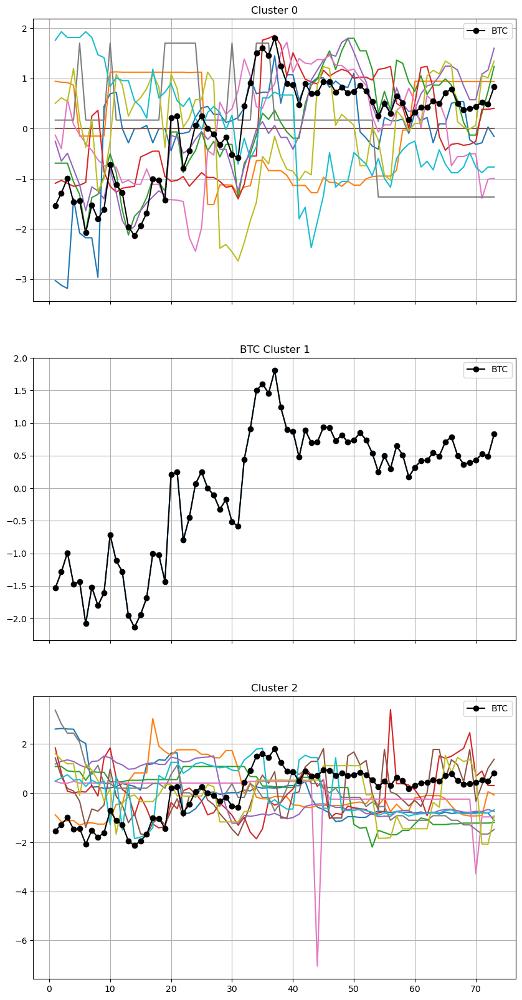

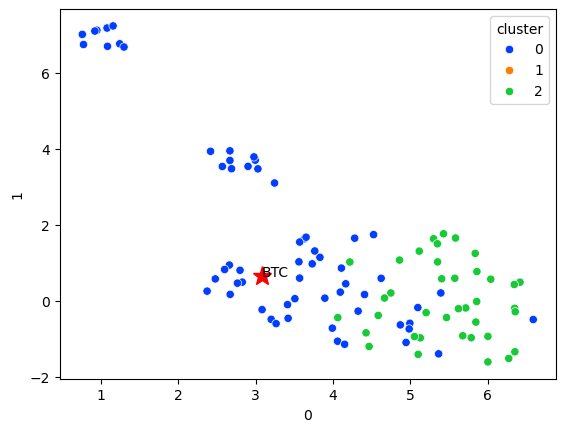

In [174]:
kmeans = KMeans(
    n_clusters=3,
    max_iter=100,
    random_state=SEED
)

pred_cl = kmeans.fit_predict(df_tsfel_sc)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_tsfel_sc,
        df_hist,
        currencies_tsfel,
        # show_cluster=1,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

На фичах tsfel получили низкие метрики, BTC отделяется в отдельный кластер, остальные кластера так же шумные

##### tsfel+HDBSCAN

Silhouette score: 0.07910733363327643
Davies-Bouldin score: 2.3829115523126947
Clusters:
cluster
-1    43
 1    39
 0     9
 2     9
Name: count, dtype: int64
BTC cluster: -1


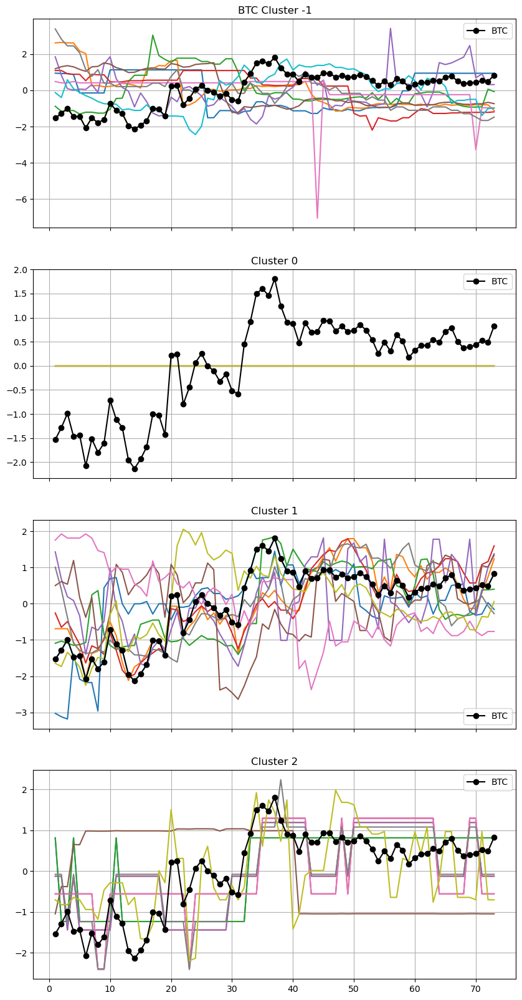

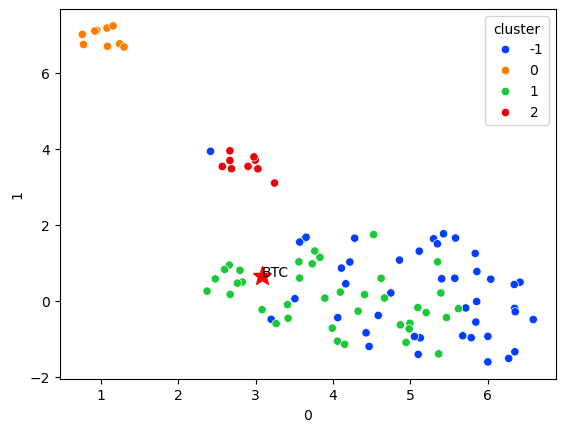

In [175]:
hdbscan = HDBSCAN()

pred_cl = hdbscan.fit_predict(df_tsfel_sc)
s = silhouette_score(df_tsfel_sc, pred_cl)
db = davies_bouldin_score(df_tsfel_sc, pred_cl)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_tsfel_sc,
        df_hist,
        currencies_tsfel,
        # show_cluster=1,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

HDBSCAN на фичах tsfel не даёт приемлемого разделения, разве что кластер 0 со стабильными криптовалютами

##### raw+KMeans (DTW)

Clusters: 2
Inertia: 68557.69848446433
Silhouette score: 0.9898606608127642
Davies-Bouldin score: 0.000127731339843577
Clusters: 3
Inertia: 5050.745013246415
Silhouette score: 0.9729346071100713
Davies-Bouldin score: 0.18425204130880882
Clusters: 4
Inertia: 278.3896927464156
Silhouette score: 0.9626142217268822
Davies-Bouldin score: 0.0040714840718420525
Clusters: 5
Inertia: 60.027012432567915
Silhouette score: 0.8972179182620375
Davies-Bouldin score: 0.1009198085963408
Clusters: 6
Inertia: 22.753533646047504
Silhouette score: 0.8649665603093634
Davies-Bouldin score: 0.17867763696352937
Clusters: 7
Inertia: 12.406661813664764
Silhouette score: 0.8479642035090517
Davies-Bouldin score: 0.16941036040287402
Clusters: 8
Inertia: 6.703543923374479
Silhouette score: 0.7975061024922867
Davies-Bouldin score: 0.24717874257989253
Clusters: 9
Inertia: 3.6711229233744778
Silhouette score: 0.792045354398086
Davies-Bouldin score: 0.17150492928319408
Clusters: 10
Inertia: 2.2817778698918234
Silhouette

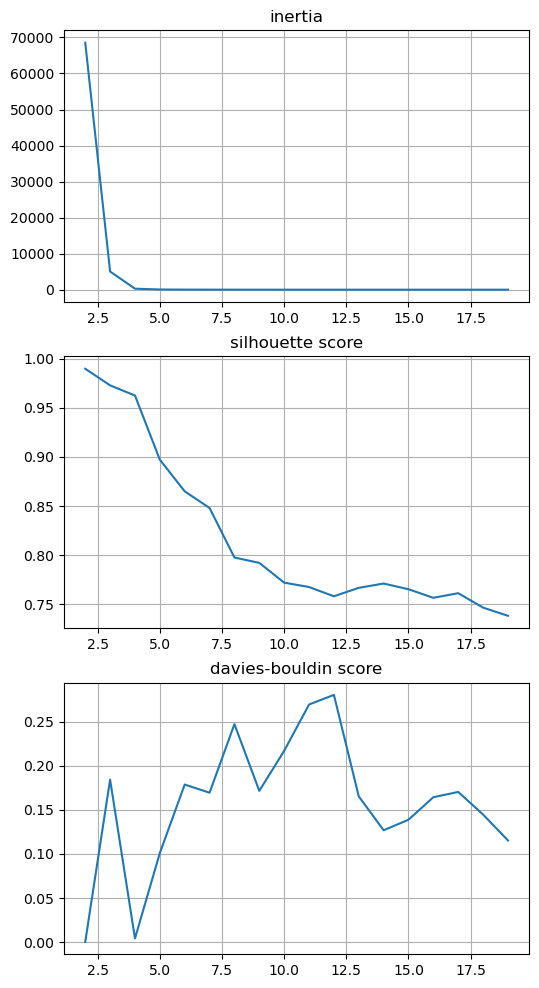

In [176]:
kmeans_adjust(
    df_hist_raw,
    max_iter=100,
    max_clusters=20,
    dtw='dtw',
    seed=SEED,
)

Выберем k=5

Silhouette score: 0.9626142217268822
Davies-Bouldin score: 0.0040714840718420525
Clusters:
cluster
0    97
1     1
2     1
3     1
Name: count, dtype: int64
BTC cluster: 1


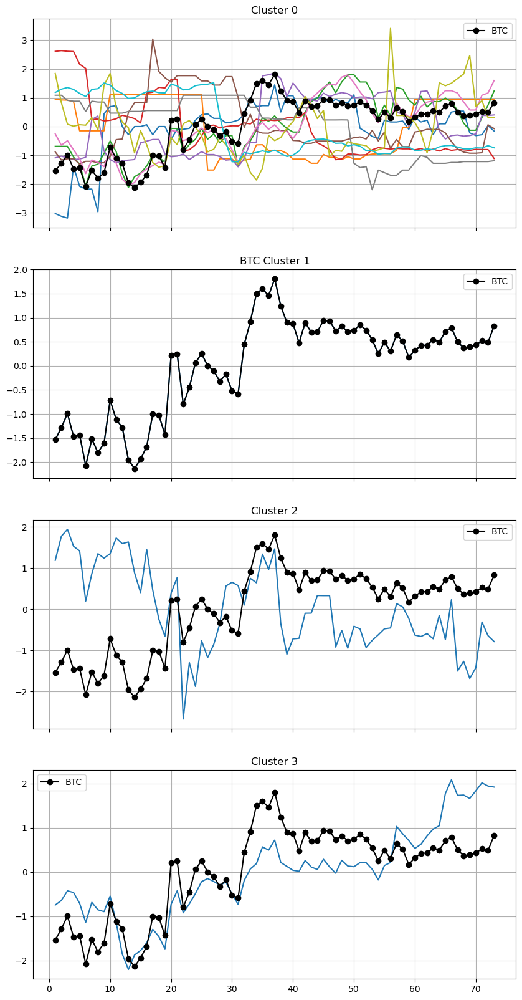

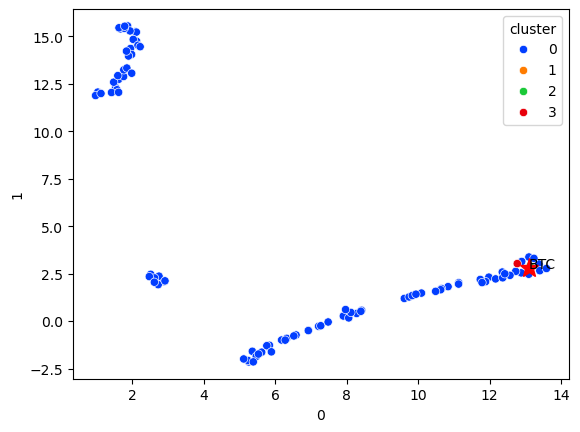

In [177]:
kmeans = TimeSeriesKMeans(
                                n_clusters=4, 
                                metric="dtw",
                                max_iter=100, 
                                random_state=SEED
                                )

pred_cl = kmeans.fit_predict(df_hist_raw)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_hist_raw,
        df_hist,
        df_hist_raw.index,
        # show_cluster=2,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

Как и в остальных случаях с кластеризацией на исходных рядах для KMeans на основе метрики DTW BTC отделяется в отдельный кластер, а большая часть в другой, что не очень пригодно для анализа

##### raw+KMeans (softDTW)

Clusters: 2
Inertia: 283753900814.76587
Silhouette score: 0.9898606608127642
Davies-Bouldin score: 0.000127731339843577
Clusters: 3
Inertia: 983890332.8676633
Silhouette score: 0.9729346071100713
Davies-Bouldin score: 0.18425204130880882
Clusters: 4
Inertia: 2206440.208834332
Silhouette score: 0.9626142217268822
Davies-Bouldin score: 0.0040714840718420525
Clusters: 5
Inertia: 58482.23043375811
Silhouette score: 0.8972179182620375
Davies-Bouldin score: 0.1009198085963408
Clusters: 6
Inertia: 20968.24229927023
Silhouette score: 0.8516525707524818
Davies-Bouldin score: 0.1938056395945745
Clusters: 7
Inertia: 16859.363443145674
Silhouette score: 0.8044611237567193
Davies-Bouldin score: 0.29068615577098933
Clusters: 8
Inertia: 13578.17130171514
Silhouette score: 0.8425034554148506
Davies-Bouldin score: 0.10591425136247502
Clusters: 9
Inertia: 14021.454188255353
Silhouette score: 0.7810361794183247
Davies-Bouldin score: 0.1791836823679635


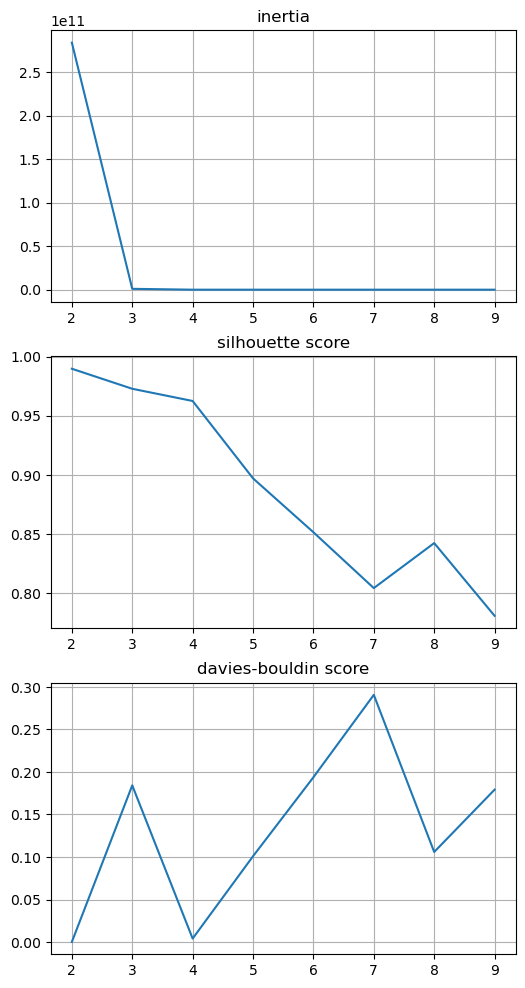

In [178]:
kmeans_adjust(
    df_hist_raw,
    max_iter=100,
    max_clusters=10,
    dtw='softdtw',
    seed=SEED,
)

Silhouette score: 0.9729346071100713
Davies-Bouldin score: 0.18425204130880882
Clusters:
cluster
0    97
2     2
1     1
Name: count, dtype: int64
BTC cluster: 1


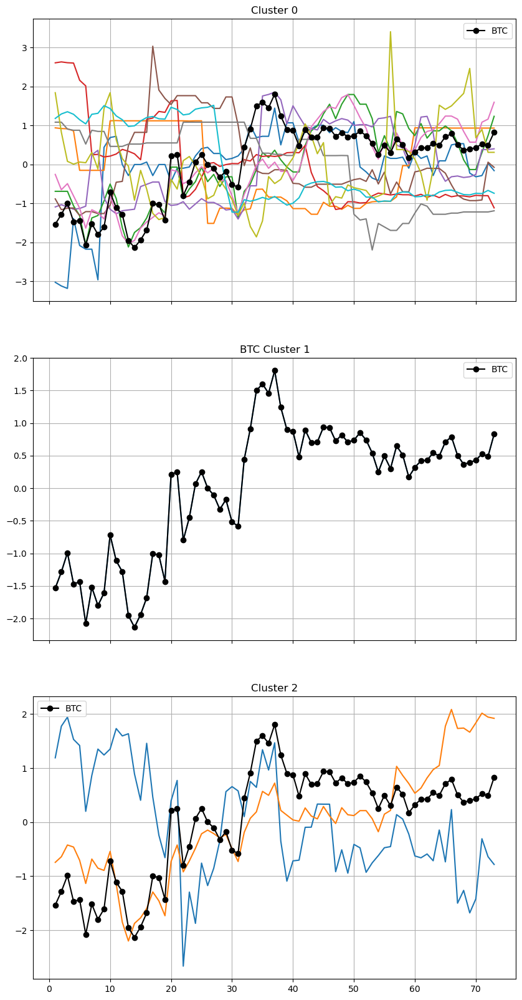

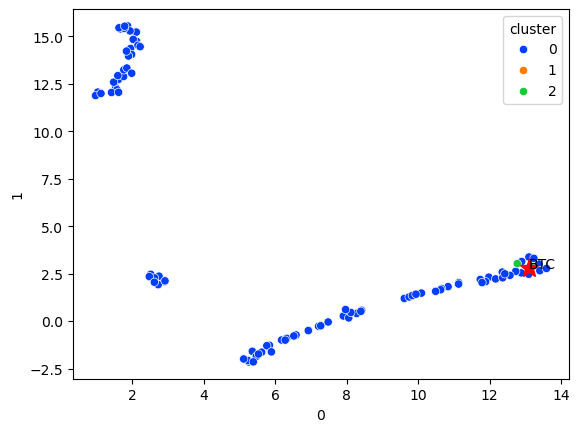

In [179]:
kmeans = TimeSeriesKMeans(
                                n_clusters=3, 
                                metric="softdtw",
                                max_iter=100, 
                                random_state=SEED
                                )

pred_cl = kmeans.fit_predict(df_hist_raw)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_hist_raw,
        df_hist,
        df_hist_raw.index,
        # show_cluster=2,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

То же результат, что и в случае Kmeans на основе DTW

##### Summary

1. Справедлива большая часть выводов анализа предыдущей группы 30д/1д
1. Наилучшим подходом стала кластеризация на фичах tsfresh + алгоритм HDBSCAN
1. Кластеризация на исходных временных рядах и фичах tsfel так же работает плохо

Список криптовалют, отличных от кластера BTC (на основе tsfresh+HDBSCAN)

In [180]:
diff_currs_3d

['BS',
 'DNA',
 'EGT',
 'MIM',
 'MOW',
 'OBROK',
 'QTF',
 'WABI',
 'XCHF',
 'INVI',
 'OKSE',
 'RS',
 'TAPT',
 'UNIC',
 'AZY',
 'BBC',
 'BEER',
 'BOBO',
 'DCB',
 'ELU',
 'GTCOIN',
 'GUMMY',
 'HARAMBE',
 'HYPC',
 'MEE',
 'NCN',
 'RFT',
 'ZOON']

#### 1 hour history with 1 minute interval

##### Load

In [181]:
df_hist = pd.read_csv('./data/price_hist_1h.csv')

In [182]:
df_hist = df_hist.sort_values(['currency', 'time'], ascending=True)
df_hist = df_hist.assign(time_n=df_hist.groupby(['currency']).cumcount().add(1))

Выведем несколько временнных рядов, отнормированных на начальное значение, в сравнение с биткоином

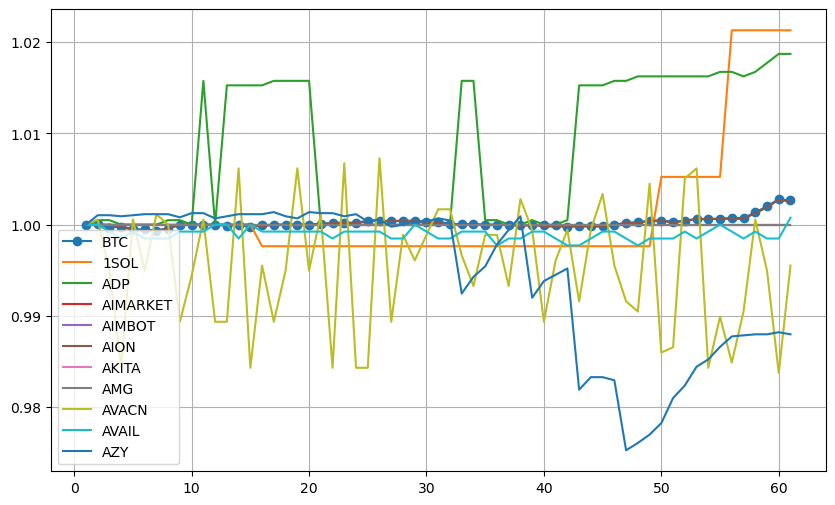

In [183]:
show_lim = 10
curr_list_show = ['BTC']
curr_list_show.extend(list(df_hist.currency.unique()[:show_lim]))

fig, ax = plt.subplots(1, figsize=(10,6))
for currency in curr_list_show:
    ls = 'o-' if currency == 'BTC' else '-'
    vals = df_hist.query(f'currency == "{currency}"').reset_index(drop=True)
    ax.plot(vals.time_n, vals.price / (vals.query('time_n == 1').price.values[0] + 1e-20), ls, label=currency)
    ax.legend()
    ax.grid(True)
plt.show();

##### Scale time series

In [184]:
df_hist = scale_ts(df_hist, StandardScaler)

##### Raw format

Исходные данные приводятся к необходимому для кластеризации виду

In [185]:
df_hist_raw = df_hist.pivot(index='currency', columns='time_n', values='price')

In [186]:
ind_raw = df_hist_raw.index

##### raw+KMeans

Clusters: 2
Inertia: 2182976.5627905326
Silhouette score: 0.9899141071635928
Davies-Bouldin score: 7.722705071878055e-05
Clusters: 3
Inertia: 100332.4271024253
Silhouette score: 0.9678790146846147
Davies-Bouldin score: 0.00702488631624399
Clusters: 4
Inertia: 8753.915675356498
Silhouette score: 0.9364946537095219
Davies-Bouldin score: 0.07871293340656972
Clusters: 5
Inertia: 2608.770387423829
Silhouette score: 0.8961568509177377
Davies-Bouldin score: 0.15105020993989815
Clusters: 6
Inertia: 1232.191312423846
Silhouette score: 0.899348490452818
Davies-Bouldin score: 0.13666544565987934
Clusters: 7
Inertia: 459.523301996334
Silhouette score: 0.8734158199031522
Davies-Bouldin score: 0.20570928240068476
Clusters: 8
Inertia: 272.37265095200235
Silhouette score: 0.8641006075363101
Davies-Bouldin score: 0.26683414933349625
Clusters: 9
Inertia: 202.31437459194828
Silhouette score: 0.8326872066984428
Davies-Bouldin score: 0.30191961616865703
Clusters: 10
Inertia: 138.72680092528265
Silhouette s

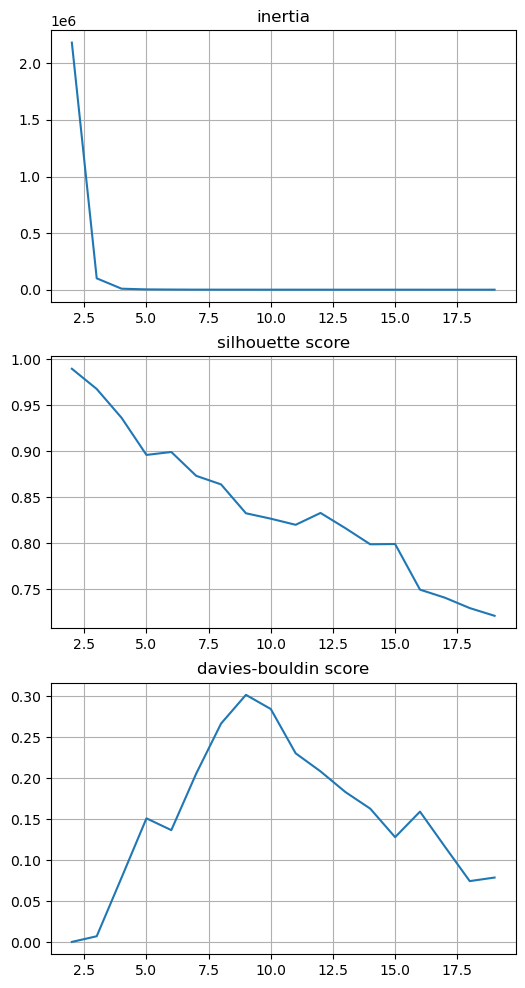

In [187]:
kmeans_adjust(
    df_hist_raw,
    max_iter=100,
    max_clusters=20,
    dtw=None,
    seed=SEED,
)

Выберем k=3

Silhouette score: 0.9678790146846147
Davies-Bouldin score: 0.00702488631624399
Clusters:
cluster
0    98
1     1
2     1
Name: count, dtype: int64
BTC cluster: 1


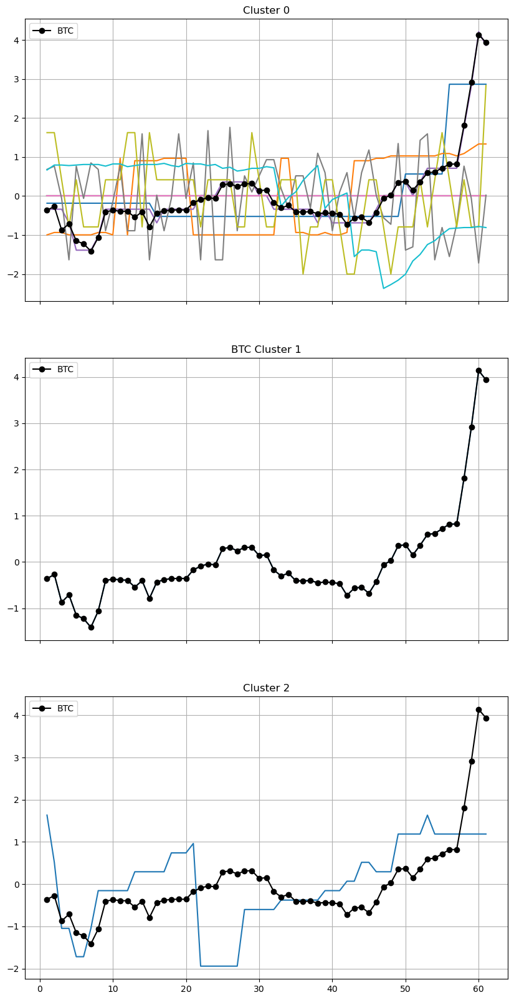

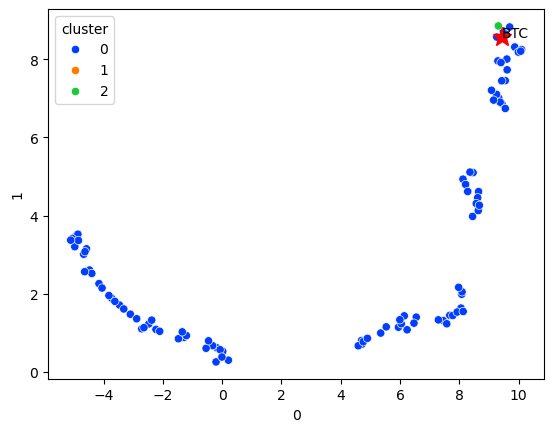

In [188]:
kmeans = KMeans(
    n_clusters=3,
    max_iter=100,
    random_state=SEED
)

pred_cl = kmeans.fit_predict(df_hist_raw)

curr_clusters = evaluate_clustering(
                                    pred_cl,
                                    df_hist_raw,
                                    df_hist,
                                    df_hist_raw.index,
                                    # show_cluster=0,
                                    show_limit=10,
                                    norm_by_first_val=False,
                                    random_state=SEED
                            )

Несмотря на неплохие метрики, KMeans на исходных данных не способен хорошо разделить временные ряды по группам, почти все криптовалюты складываются в один кластер, а BTC оказывается стоять особняком в отдельном кластере. Ситуация аналогична для других значений k

##### dimension reduction+raw+KMeans

Теперь снизим размерность исходных рядов до 5 компонент

In [189]:
umap_model = umap.UMAP(n_components=5, random_state=SEED)
df_hist_red = umap_model.fit_transform(df_hist_raw)
df_hist_red = pd.DataFrame(df_hist_red, index=df_hist_raw.index)

Clusters: 2
Inertia: 1278.1282958984375
Silhouette score: 0.6953138113021851
Davies-Bouldin score: 0.4819467470877607
Clusters: 3
Inertia: 265.7580261230469
Silhouette score: 0.8068731427192688
Davies-Bouldin score: 0.2735975990833816
Clusters: 4
Inertia: 144.65731811523438
Silhouette score: 0.741881787776947
Davies-Bouldin score: 0.3704866936834291
Clusters: 5
Inertia: 79.56925201416016
Silhouette score: 0.6599627733230591
Davies-Bouldin score: 0.4878516657307719
Clusters: 6
Inertia: 57.794944763183594
Silhouette score: 0.6486648321151733
Davies-Bouldin score: 0.4912740634889096
Clusters: 7
Inertia: 34.85978698730469
Silhouette score: 0.6874755620956421
Davies-Bouldin score: 0.4236029173709704
Clusters: 8
Inertia: 28.056385040283203
Silhouette score: 0.6046057939529419
Davies-Bouldin score: 0.5155337434887209
Clusters: 9
Inertia: 23.862743377685547
Silhouette score: 0.592487096786499
Davies-Bouldin score: 0.521694674157231
Clusters: 10
Inertia: 19.05401611328125
Silhouette score: 0.58

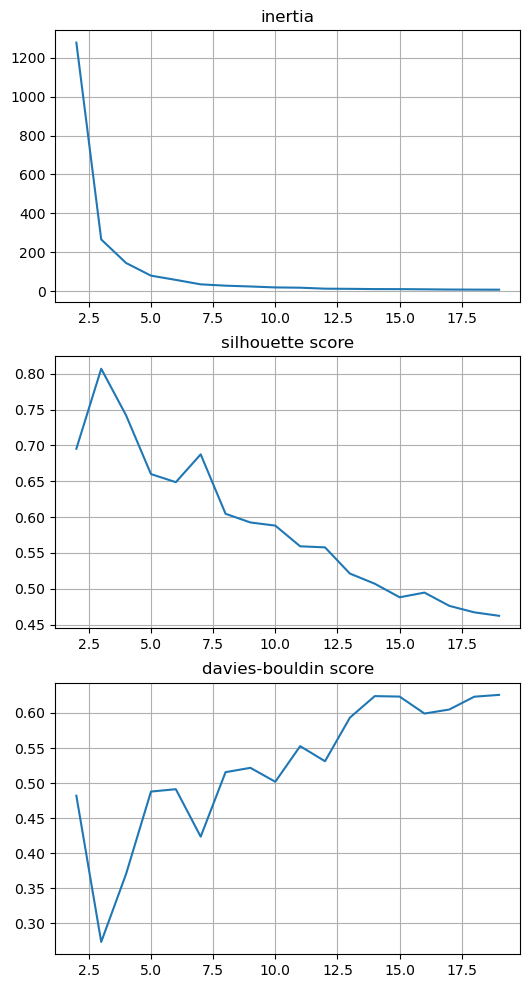

In [190]:
kmeans_adjust(
    df_hist_red,
    max_iter=100,
    max_clusters=20,
    dtw=None,
    seed=SEED,
)

Выберем k=3

Silhouette score: 0.8068731427192688
Davies-Bouldin score: 0.2735975990833816
Clusters:
cluster
0    40
1    37
2    23
Name: count, dtype: int64
BTC cluster: 2


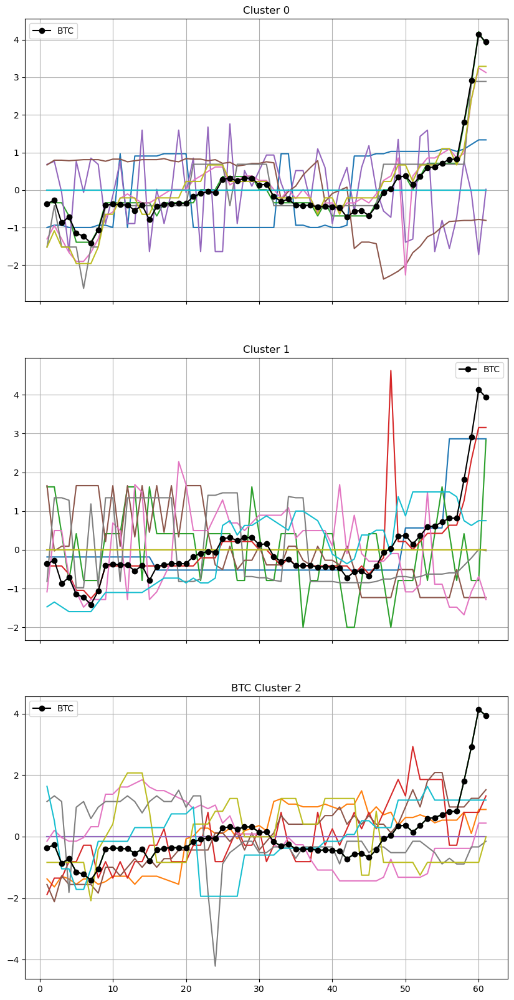

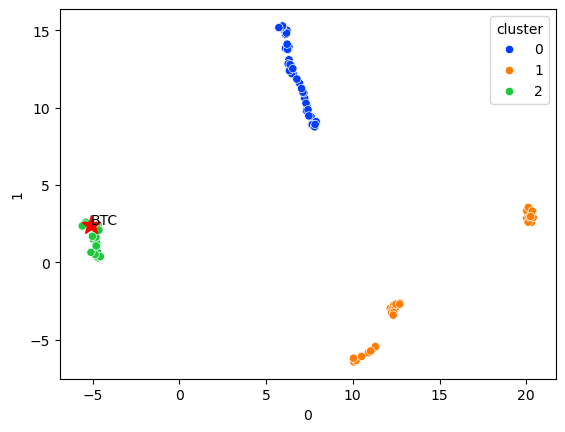

In [191]:
kmeans = KMeans(
    n_clusters=3,
    max_iter=100,
    random_state=SEED
)

pred_cl = kmeans.fit_predict(df_hist_red)

curr_clusters = evaluate_clustering(
                                    pred_cl,
                                    df_hist_red,
                                    df_hist,
                                    df_hist_red.index,
                                    # show_cluster=1,
                                    show_limit=10,
                                    norm_by_first_val=False,
                                    random_state=SEED
                            )

Понижение размерности позволило разбить ряды на более сбалансированные по размеру кластера. Из графиков выше очевидно что кластера получаются слишком шумными (что отражается в более низких метриках). Полученные кластеры тяжело анализировать. Хотя можно выделить кластер 2, в котором динамика цен примерно с 55 минуты не повторяет рост BTC 

##### raw+HDBSCAN

Silhouette score: 0.2042097323652603
Davies-Bouldin score: 1.9246886923838287
Clusters:
cluster
 6    30
-1    30
 5     9
 1     7
 0     7
 3     6
 4     6
 2     5
Name: count, dtype: int64
BTC cluster: -1


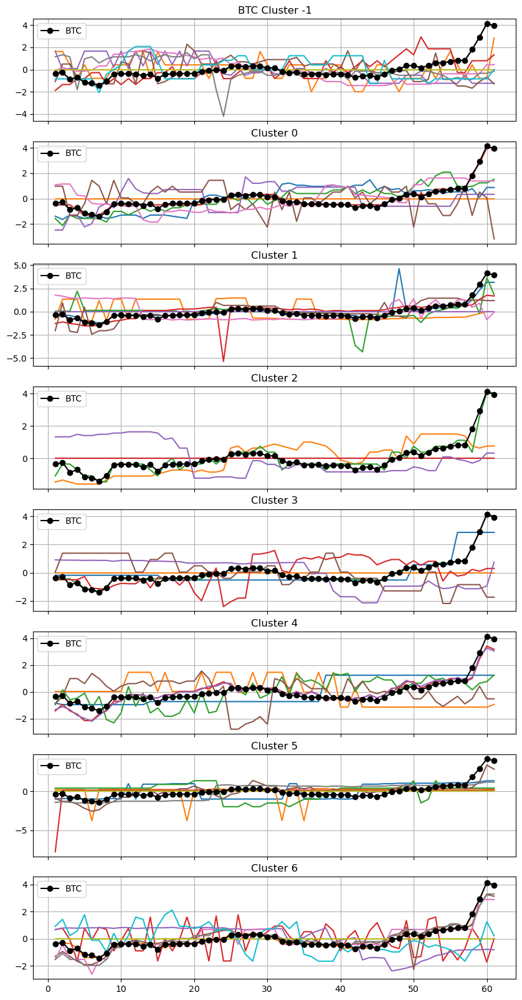

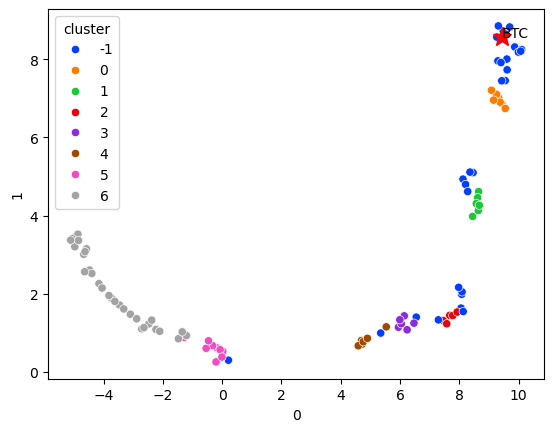

In [192]:
hdbscan = HDBSCAN()

pred_cl = hdbscan.fit_predict(df_hist_raw)
s = silhouette_score(df_hist_raw, pred_cl)
db = davies_bouldin_score(df_hist_raw, pred_cl)

curr_clusters = evaluate_clustering(
                                        pred_cl,
                                        df_hist_raw,
                                        df_hist,
                                        ind_raw,
                                        # show_cluster=1,
                                        show_limit=10,
                                        norm_by_first_val=False,
                                        random_state=SEED
                                )

Алгоритм иерархической кластеризации HDBSCAN на исходных данных дал слишком шумные кластера, сложные для визуального анализа

##### dimension reduction+raw+HDBSCAN

Теперь снизим размерность исходных рядов до 5 компонент

In [193]:
umap_model = umap.UMAP(n_components=5, random_state=SEED)
df_hist_red = umap_model.fit_transform(df_hist_raw)
df_hist_red = pd.DataFrame(df_hist_red, index=df_hist_raw.index)

Silhouette score: 0.8068731427192688
Davies-Bouldin score: 0.2735975990833816
Clusters:
cluster
0    40
1    37
2    23
Name: count, dtype: int64
BTC cluster: 2


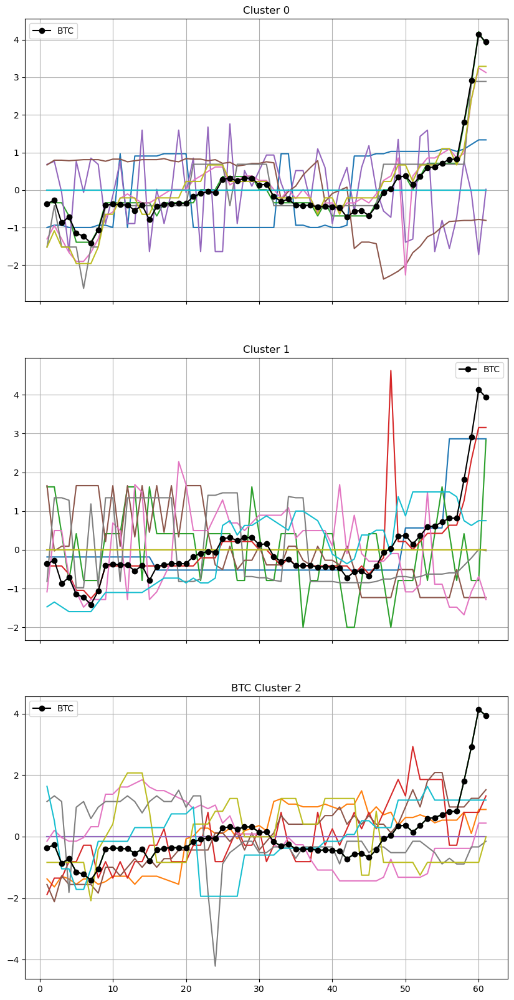

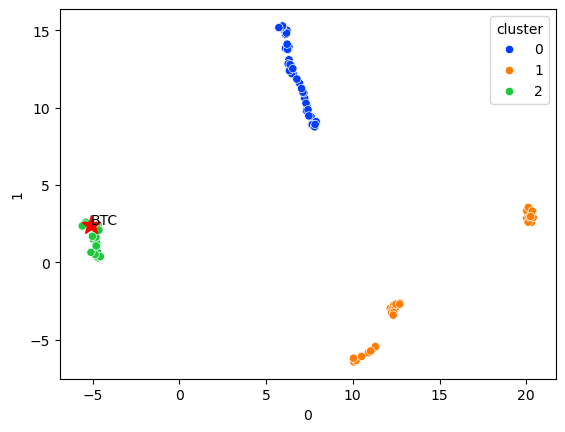

In [194]:
hdbscan = HDBSCAN()

pred_cl = hdbscan.fit_predict(df_hist_red)
s = silhouette_score(df_hist_red, pred_cl)
db = davies_bouldin_score(df_hist_red, pred_cl)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_hist_red,
        df_hist,
        ind_raw,
        # show_cluster=1,
        show_limit=10,
        norm_by_first_val=False
)

Понижение размерностей дало буст в метриках, избавило от кластера "шумных" сэмплов, на scatter plot поучившиеся кластеры хорошо разделены, но по графикам динамики цены сложно судить о реальном различие кластеров... 

##### Extract and preprocess tsfresh features

Извлечем полный набор фичей tsfresh и сделаем их препроцессинг

In [195]:
df_tsfr = extract_features(
    df_hist,
    column_id='currency',
    column_sort='time_n',
    column_value='price_n',
    default_fc_parameters=ComprehensiveFCParameters(),
    n_jobs=4,
)

Feature Extraction: 100%|██████████| 20/20 [00:10<00:00,  1.92it/s]


In [197]:
df_tsfr_sc, idx_tsfr = preprocess_extracted(
        df_tsfr.drop(columns=['price_n__variation_coefficient']),
        nan_thresh=0.9,
        fill_na_val=0,
        scaler=StandardScaler,

)

Initial shape: (100, 782)
After drop nans: (100, 505)
After drop singular value cols: (100, 482)
After drop cols with infs: (100, 481)


##### tsfresh+KMeans

Clusters: 2
Inertia: 41957.472092935626
Silhouette score: 0.17823790446442891
Davies-Bouldin score: 2.418791839830535
Clusters: 3
Inertia: 33052.32347702878
Silhouette score: 0.25059822701904655
Davies-Bouldin score: 1.8691065762311523
Clusters: 4
Inertia: 32495.538632386877
Silhouette score: 0.22076516958031944
Davies-Bouldin score: 1.6088672357125937
Clusters: 5
Inertia: 31097.610254268915
Silhouette score: 0.19145896999377177
Davies-Bouldin score: 1.9820227089302414
Clusters: 6
Inertia: 28581.649029117532
Silhouette score: 0.1828565203701481
Davies-Bouldin score: 2.07656692965918
Clusters: 7
Inertia: 28008.827321736073
Silhouette score: 0.18327501301966528
Davies-Bouldin score: 2.0380544123754487
Clusters: 8
Inertia: 25731.596124231794
Silhouette score: 0.20314135860314292
Davies-Bouldin score: 2.1887330457949825
Clusters: 9
Inertia: 24489.45594974434
Silhouette score: 0.1873160188246149
Davies-Bouldin score: 2.065344580588063
Clusters: 10
Inertia: 23858.152846156736
Silhouette scor

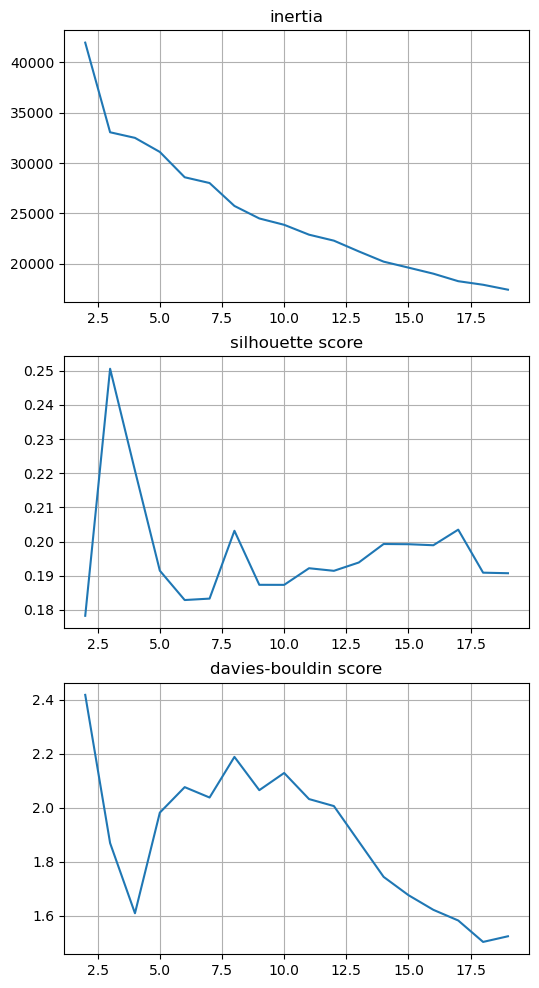

In [198]:
kmeans_adjust(
    df_tsfr_sc,
    max_iter=100,
    max_clusters=20,
    dtw=None,
    seed=SEED,
)

Выберем k=4

Silhouette score: 0.25059822701904655
Davies-Bouldin score: 1.8691065762311523
Clusters:
cluster
0    46
1    32
2    22
Name: count, dtype: int64
BTC cluster: 0


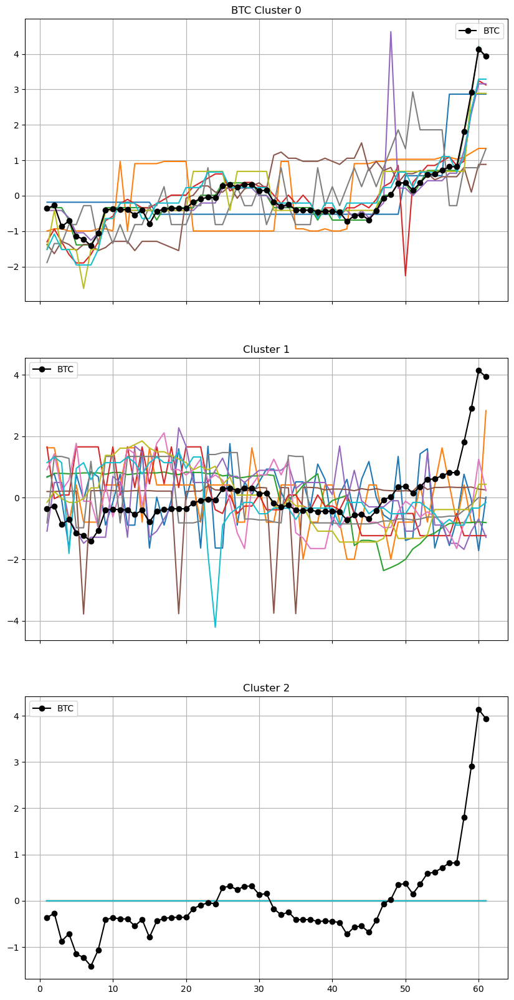

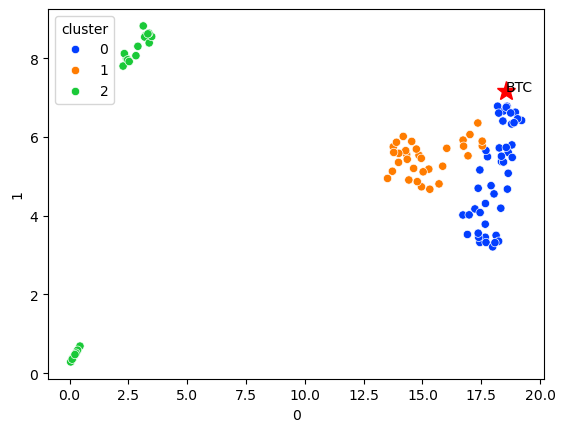

In [199]:
kmeans = KMeans(
    n_clusters=3,
    max_iter=100,
    random_state=SEED
)

pred_cl = kmeans.fit_predict(df_tsfr_sc)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_tsfr_sc,
        df_hist,
        idx_tsfr,
        # show_cluster=0,
        show_limit=10,
        norm_by_first_val=False
)

Несмотря на то, что кластеры получились шумные, можно визуально отследить, что криптовалюты кластера BTC (0) в среднем как и BTC имееют тенденцию на резкий скачок в районе ~55 мин. Напротив, криптовалюты из кластера 1 не имеют в среднем такой динамики. Также выделился кластер 2 со стабилиьными по цене криптовалютами.
Т.е. валбты кластеров 1 и 2 имеют отличную от BTC динамику.

In [202]:
diff_currs_1h = []
diff_currs_1h.extend(curr_clusters[1])
diff_currs_1h.extend(curr_clusters[2])

In [203]:
len(diff_currs_1h)

54

##### tsfresh+HDBSCAN

Silhouette score: 0.24099627606130258
Davies-Bouldin score: 1.814205001420691
Clusters:
cluster
 0    56
-1    22
 2     9
 3     8
 1     5
Name: count, dtype: int64
BTC cluster: -1


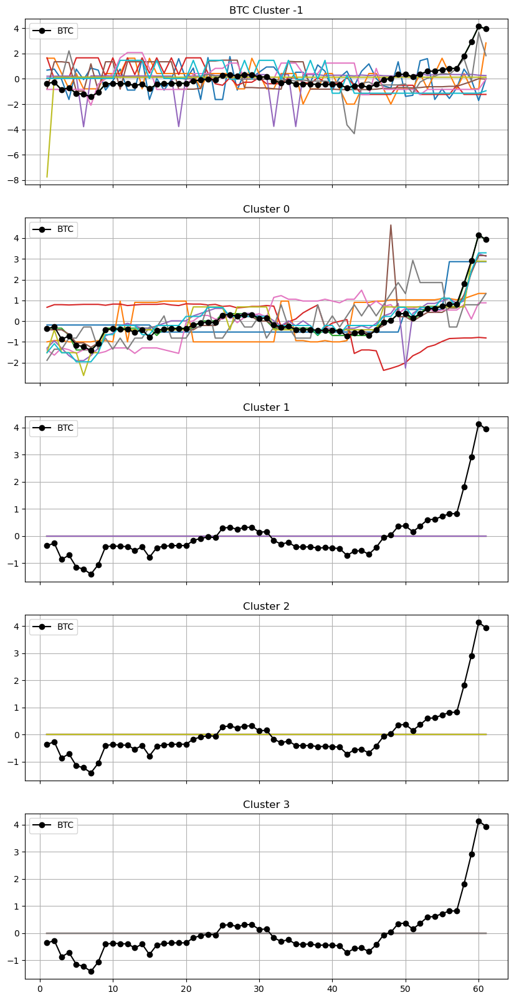

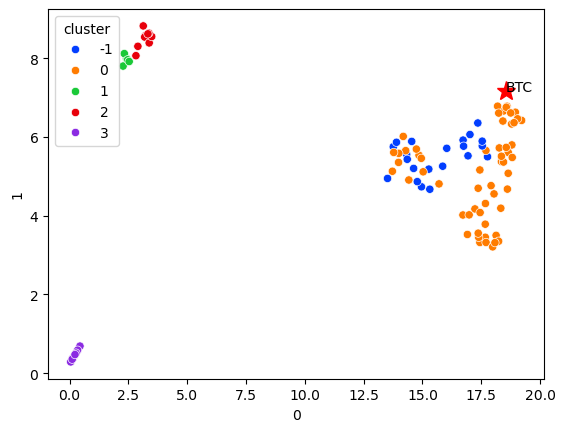

In [204]:
hdbscan = HDBSCAN()

pred_cl = hdbscan.fit_predict(df_tsfr_sc)
s = silhouette_score(df_tsfr_sc, pred_cl)
db = davies_bouldin_score(df_tsfr_sc, pred_cl)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_tsfr_sc,
        df_hist,
        idx_tsfr,
        # show_cluster=1,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

В отличие от предыдущих случаев, связка tsfresh+HDBSCAN в данном случае работает хуже tsfresh+KMeans. Алгоритм способен выделить кластеры со стаблиьными валютами. Одгако кластер 0 оказывается сильно замешан с "шумовым" кластером, куда попадает и BTC (это хорошо видно по sactter plot)

##### Extract and preprocess tsfel features

Извлечем полный набор фичей tsfel

In [205]:
data_tsfel, currencies_tsfel = to_tsfel_format(df_hist)

In [206]:
cfg = tsfel.get_features_by_domain()
df_tsfel = tsfel.time_series_features_extractor(cfg, data_tsfel)

In [207]:
df_tsfel_sc, idx_tsfel = preprocess_extracted(
        df_tsfel,
        nan_thresh=0.9,
        fill_na_val=0,
        scaler=StandardScaler,

)

Initial shape: (100, 155)
After drop nans: (100, 155)
After drop singular value cols: (100, 143)
After drop cols with infs: (100, 143)


##### tsfel+kmeans

Clusters: 2
Inertia: 12536.298219318636
Silhouette score: 0.7993805858951198
Davies-Bouldin score: 0.13854902800767338
Clusters: 3
Inertia: 4314.478044769081
Silhouette score: 0.4211918018856139
Davies-Bouldin score: 1.0998934640977625
Clusters: 4
Inertia: 3564.7377976491753
Silhouette score: 0.42348031778946543
Davies-Bouldin score: 0.7754443894080176
Clusters: 5
Inertia: 1770.6140326251148
Silhouette score: 0.38465076855480496
Davies-Bouldin score: 0.3979821594110037
Clusters: 6
Inertia: 3128.259691080706
Silhouette score: 0.268637570256256
Davies-Bouldin score: 1.302227102902722
Clusters: 7
Inertia: 1426.6929086651878
Silhouette score: 0.2601229874766253
Davies-Bouldin score: 0.9664697552921268
Clusters: 8
Inertia: 1167.8139118302113
Silhouette score: 0.2687013925643909
Davies-Bouldin score: 0.6915212801119881
Clusters: 9
Inertia: 1038.3822489509498
Silhouette score: 0.2684086045992448
Davies-Bouldin score: 0.7284600223739356
Clusters: 10
Inertia: 831.8213646426693
Silhouette score:

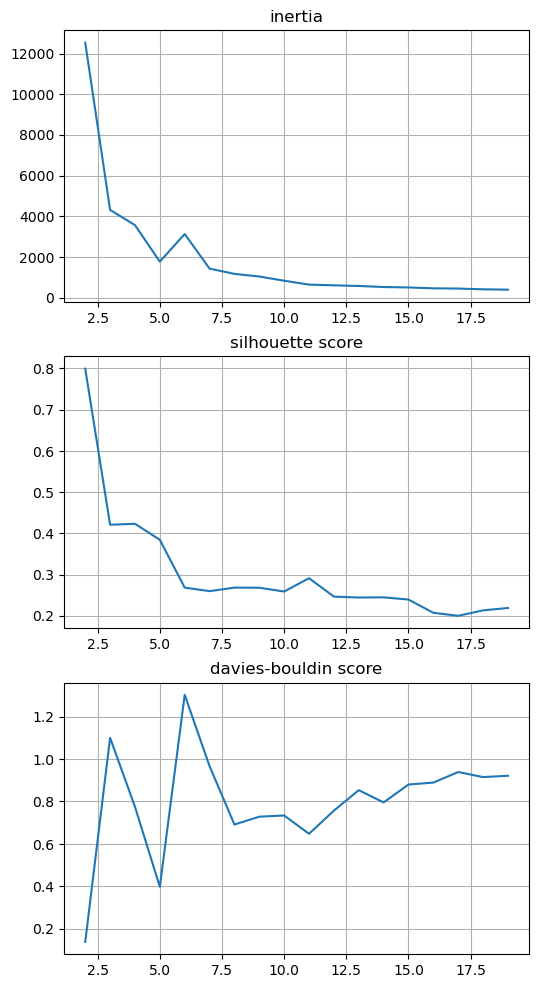

In [208]:
kmeans_adjust(
    df_tsfel_sc,
    max_iter=100,
    max_clusters=20,
    dtw=None,
    seed=SEED,
)

Выберем k=5

Silhouette score: 0.38465076855480496
Davies-Bouldin score: 0.3979821594110037
Clusters:
cluster
2    75
4    22
1     1
0     1
3     1
Name: count, dtype: int64
BTC cluster: 1


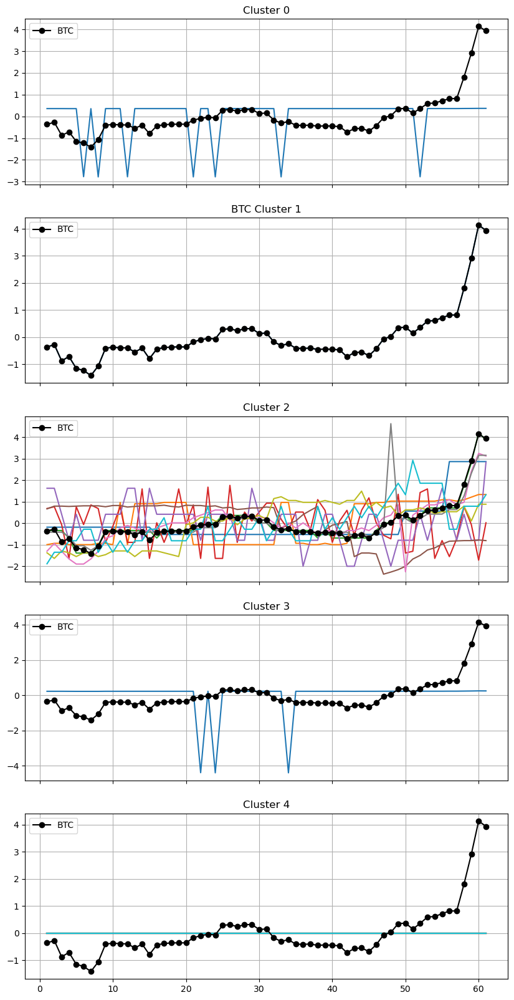

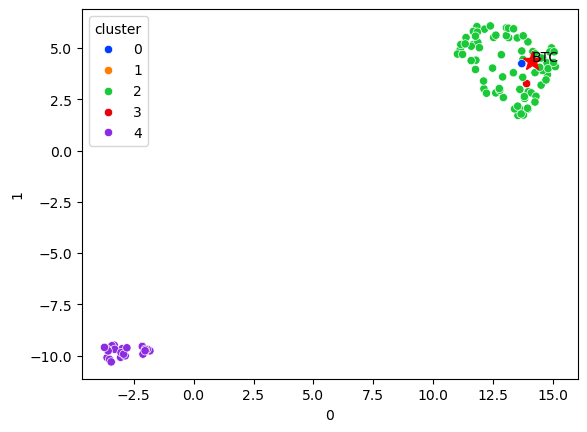

In [209]:
kmeans = KMeans(
    n_clusters=5,
    max_iter=100,
    random_state=SEED
)

pred_cl = kmeans.fit_predict(df_tsfel_sc)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_tsfel_sc,
        df_hist,
        currencies_tsfel,
        # show_cluster=1,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

На фичах tsfel не получили приемлемого разбиения, BTC отделяется в отдельный кластер, также выделяется кластер стабильных валют

##### tsfel+HDBSCAN

Silhouette score: 0.32552731742120644
Davies-Bouldin score: 2.1334619023901276
Clusters:
cluster
 0    65
 1    15
-1    13
 2     7
Name: count, dtype: int64
BTC cluster: -1


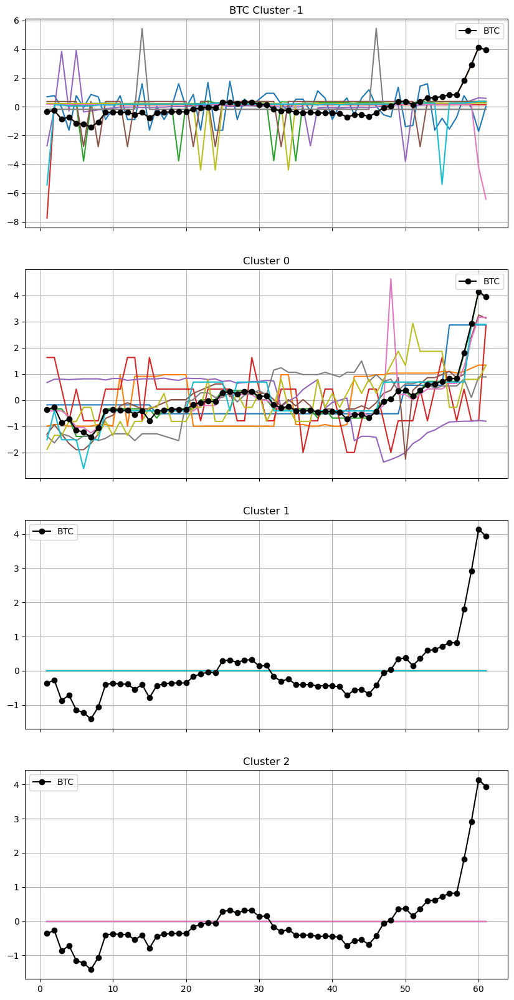

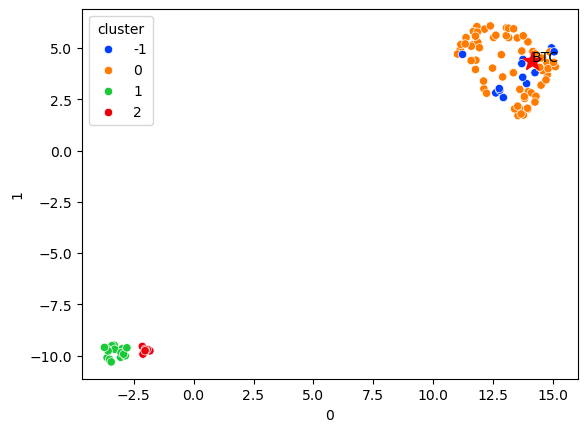

In [210]:
hdbscan = HDBSCAN()

pred_cl = hdbscan.fit_predict(df_tsfel_sc)
s = silhouette_score(df_tsfel_sc, pred_cl)
db = davies_bouldin_score(df_tsfel_sc, pred_cl)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_tsfel_sc,
        df_hist,
        currencies_tsfel,
        # show_cluster=1,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

HDBSCAN на фичах tsfel не даёт приемлемого разделения, разве что кластера 1,2 со стабильными криптовалютами

##### raw+KMeans (DTW)

Clusters: 2
Inertia: 21829.765627905315
Silhouette score: 0.9899141071635928
Davies-Bouldin score: 7.722705071878055e-05
Clusters: 3
Inertia: 1003.3242710242528
Silhouette score: 0.9678790146846147
Davies-Bouldin score: 0.00702488631624399
Clusters: 4
Inertia: 87.04865119673352
Silhouette score: 0.9364946537095219
Davies-Bouldin score: 0.07871293340656972
Clusters: 5
Inertia: 26.087659778178967
Silhouette score: 0.8961568509177377
Davies-Bouldin score: 0.15105020993989815
Clusters: 6
Inertia: 12.321869028178966
Silhouette score: 0.899348490452818
Davies-Bouldin score: 0.13666544565987934
Clusters: 7
Inertia: 4.595216550582398
Silhouette score: 0.8734158199031522
Davies-Bouldin score: 0.20570928240068476
Clusters: 8
Inertia: 2.712799294560154
Silhouette score: 0.8641006075363101
Davies-Bouldin score: 0.26683414933349625
Clusters: 9
Inertia: 2.016121931095724
Silhouette score: 0.8326872066984428
Davies-Bouldin score: 0.30191961616865703
Clusters: 10
Inertia: 1.3868178046922153
Silhouette

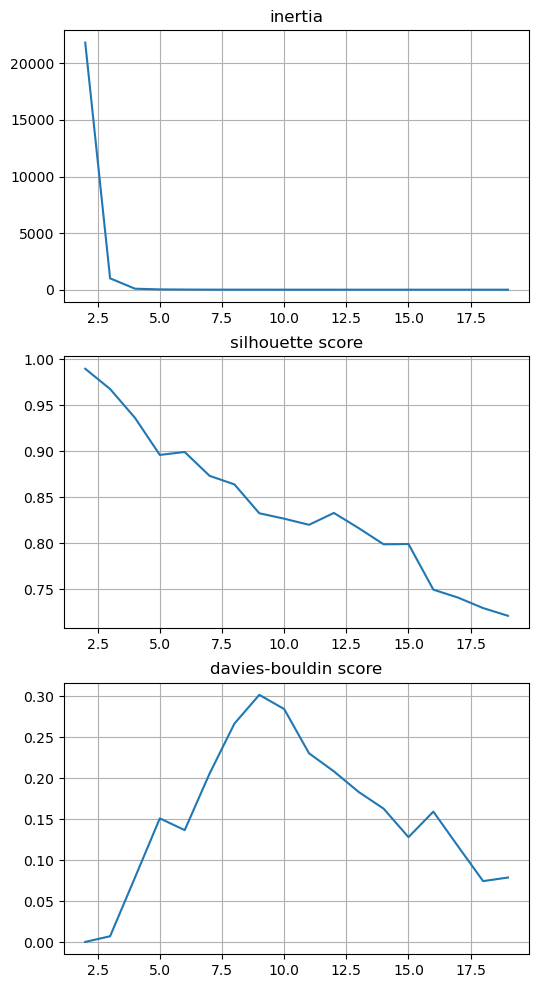

In [211]:
kmeans_adjust(
    df_hist_raw,
    max_iter=100,
    max_clusters=20,
    dtw='dtw',
    seed=SEED,
)

Выберем k=5

Silhouette score: 0.9364946537095219
Davies-Bouldin score: 0.07871293340656972
Clusters:
cluster
0    94
3     4
1     1
2     1
Name: count, dtype: int64
BTC cluster: 1


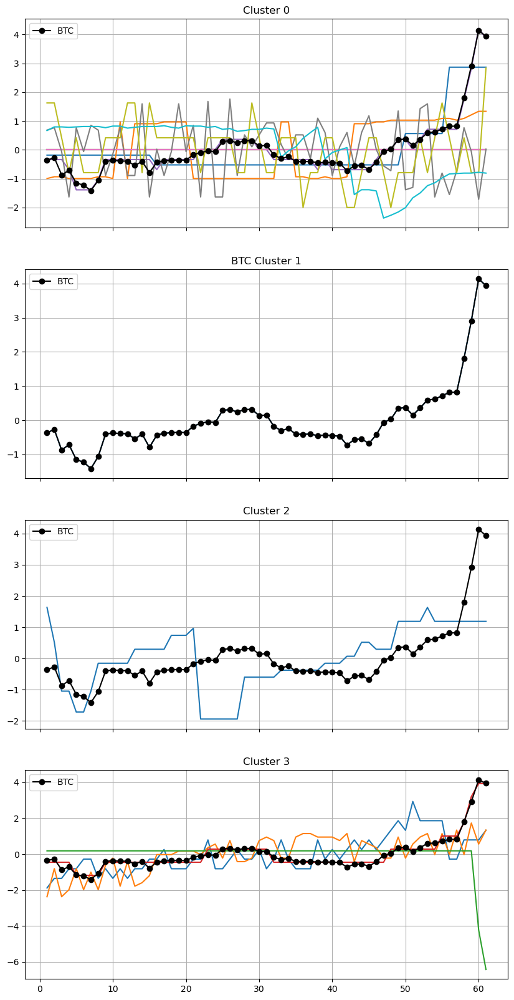

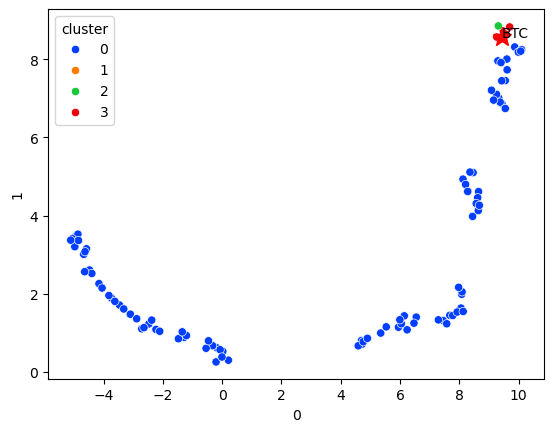

In [212]:
kmeans = TimeSeriesKMeans(
                                n_clusters=4, 
                                metric="dtw",
                                max_iter=100, 
                                random_state=SEED
                                )

pred_cl = kmeans.fit_predict(df_hist_raw)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_hist_raw,
        df_hist,
        df_hist_raw.index,
        # show_cluster=2,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

Как и в остальных случаях с кластеризацией на исходных рядах для KMeans на основе метрики DTW BTC отделяется в отдельный кластер, а большая часть в другой, что не очень пригодно для анализа

##### raw+KMeans (softDTW)

Clusters: 2
Inertia: 42544542162.54854
Silhouette score: 0.9899141071635928
Davies-Bouldin score: 7.722705071878055e-05
Clusters: 3
Inertia: 22818454.979220778
Silhouette score: 0.9678790146846147
Davies-Bouldin score: 0.00702488631624399
Clusters: 4
Inertia: 118652.48012797836
Silhouette score: 0.9364946537095219
Davies-Bouldin score: 0.07871293340656972
Clusters: 5
Inertia: 14560.894678649025
Silhouette score: 0.8961568509177377
Davies-Bouldin score: 0.15105020993989815
Clusters: 6
Inertia: 10348.125002115265
Silhouette score: 0.899348490452818
Davies-Bouldin score: 0.13666544565987934
Clusters: 7
Inertia: 9659.605068041437
Silhouette score: 0.8734158199031522
Davies-Bouldin score: 0.20570928240068476
Clusters: 8
Inertia: 9855.525154910294
Silhouette score: 0.8371032593779979
Davies-Bouldin score: 0.26630229183855714
Clusters: 9
Inertia: 9875.608554915003
Silhouette score: 0.7610135669735009
Davies-Bouldin score: 0.29732661506315256


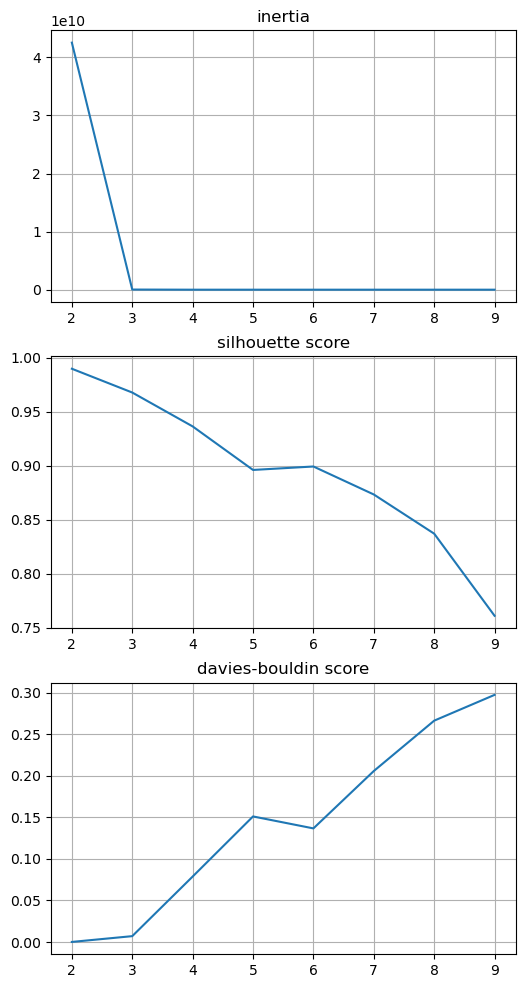

In [213]:
kmeans_adjust(
    df_hist_raw,
    max_iter=100,
    max_clusters=10,
    dtw='softdtw',
    seed=SEED,
)

Silhouette score: 0.9678790146846147
Davies-Bouldin score: 0.00702488631624399
Clusters:
cluster
0    98
1     1
2     1
Name: count, dtype: int64
BTC cluster: 1


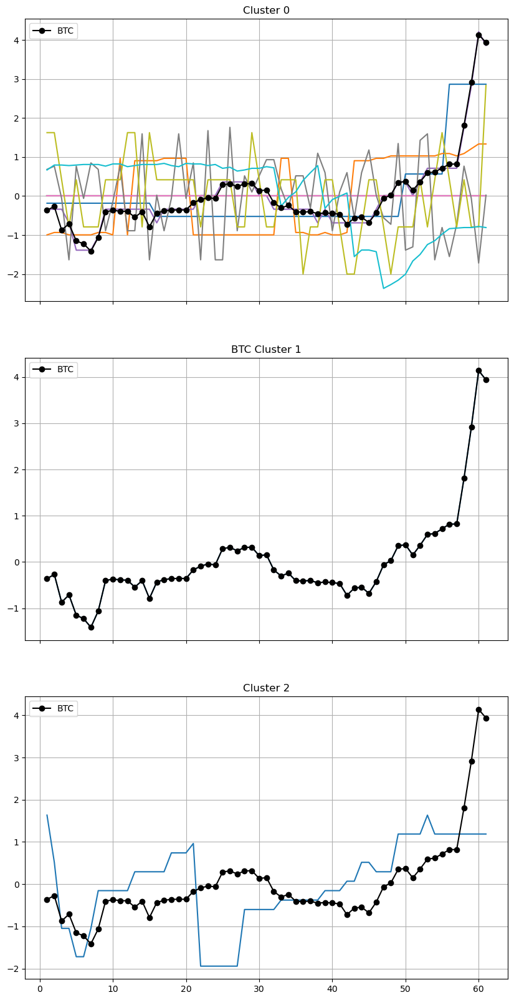

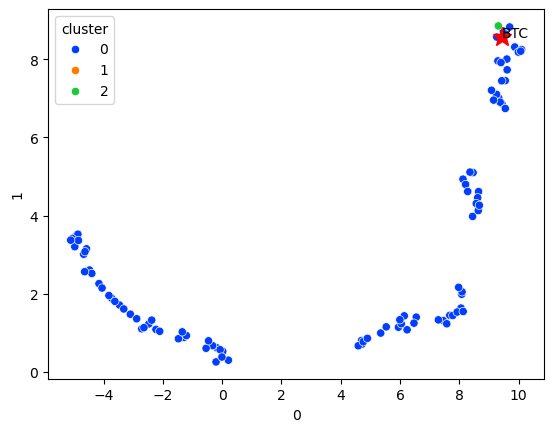

In [214]:
kmeans = TimeSeriesKMeans(
                                n_clusters=3, 
                                metric="softdtw",
                                max_iter=100, 
                                random_state=SEED
                                )

pred_cl = kmeans.fit_predict(df_hist_raw)

curr_clusters = evaluate_clustering(
        pred_cl,
        df_hist_raw,
        df_hist,
        df_hist_raw.index,
        # show_cluster=2,
        show_limit=10,
        norm_by_first_val=False,
        random_state=SEED
)

То же результат, что и в случае Kmeans на основе DTW

##### Summary

1. Справедлива большая часть выводов анализа предыдущих групп
1. Наилучшим подходом стала кластеризация на фичах tsfresh + алгоритм KMeans
1. Кластеризация на исходных временных рядах и фичах tsfel так же работает плохо

Список криптовалют, отличных от кластера BTC (на основе tsfresh+Kmeans)

In [215]:
diff_currs_1h

['AVACN',
 'AVAIL',
 'AZY',
 'CPOOL',
 'DAG',
 'DBC',
 'DOME',
 'ECTE',
 'ETHFI',
 'EWT',
 'FLOKI',
 'GFI',
 'HLG',
 'KNIGHT',
 'LCRO',
 'MAPE',
 'MDCL',
 'MNW',
 'MPL',
 'MTA',
 'MUSE',
 'NGC',
 'NHT',
 'PBTC35A',
 'PRQ',
 'SAUBER',
 'STND',
 'STRUMP',
 'TRUMP',
 'VITE',
 'XFC',
 'ZEE',
 'AIMARKET',
 'AIMBOT',
 'AKITA',
 'AMG',
 'BCOIN',
 'CBY',
 'CIX100',
 'DOTR',
 'FNF',
 'GAMEBUD',
 'JEN',
 'LQDX',
 'MB',
 'MOGUL',
 'MVPC',
 'NIOX',
 'NLS',
 'PLAC',
 'PNDC',
 'STC',
 'VEE',
 'ZEUM']

### Result

#### 30 days history with 1 day interval

Лучший подход - **tsfresh+HDBSCAN**

Список валют, отличных от кластера BTC

In [216]:
diff_currs_30d

['AEUR',
 'BICO',
 'BIST',
 'BSCPAD',
 'BSSB',
 'CEUR',
 'CHER',
 'DAO',
 'DOGA',
 'FCON',
 'FER',
 'HPO',
 'ICP',
 'IVEX',
 'JETTON',
 'KGC',
 'LPM',
 'OCH',
 'ORAI',
 'PART',
 'PBUX',
 'PEARL',
 'QLC',
 'THE9',
 'VISION',
 'VTHO',
 'XCUR',
 'XPR',
 'XVG']

#### 3 days history with 1 hour interval

Лучший подход - **tsfresh+HDBSCAN**

Список валют, отличных от кластера BTC

In [217]:
diff_currs_3d

['BS',
 'DNA',
 'EGT',
 'MIM',
 'MOW',
 'OBROK',
 'QTF',
 'WABI',
 'XCHF',
 'INVI',
 'OKSE',
 'RS',
 'TAPT',
 'UNIC',
 'AZY',
 'BBC',
 'BEER',
 'BOBO',
 'DCB',
 'ELU',
 'GTCOIN',
 'GUMMY',
 'HARAMBE',
 'HYPC',
 'MEE',
 'NCN',
 'RFT',
 'ZOON']

#### 1 hour history with 1 minute interval

Лучший подход - **tsfresh+KMeans(k=4)**

Список валют, отличных от кластера BTC

In [218]:
diff_currs_1h

['AVACN',
 'AVAIL',
 'AZY',
 'CPOOL',
 'DAG',
 'DBC',
 'DOME',
 'ECTE',
 'ETHFI',
 'EWT',
 'FLOKI',
 'GFI',
 'HLG',
 'KNIGHT',
 'LCRO',
 'MAPE',
 'MDCL',
 'MNW',
 'MPL',
 'MTA',
 'MUSE',
 'NGC',
 'NHT',
 'PBTC35A',
 'PRQ',
 'SAUBER',
 'STND',
 'STRUMP',
 'TRUMP',
 'VITE',
 'XFC',
 'ZEE',
 'AIMARKET',
 'AIMBOT',
 'AKITA',
 'AMG',
 'BCOIN',
 'CBY',
 'CIX100',
 'DOTR',
 'FNF',
 'GAMEBUD',
 'JEN',
 'LQDX',
 'MB',
 'MOGUL',
 'MVPC',
 'NIOX',
 'NLS',
 'PLAC',
 'PNDC',
 'STC',
 'VEE',
 'ZEUM']

### Final thoughts & conclusions

* Для кластерного анализа динамики цен криптовалют необходимо их отмасштабировать.
* Кластеризация на исходных данных даёт плохие результаты (видимо, из-за большого фактора шума). Методы на основе DTW не спасает, но может помочь снижение размерности.
* На извлеченных признаках (tsfresh, но не tsfel) можно получить хорошее разбиение на кластеры.